![](https://raw.githubusercontent.com/FrankFeng-23/SPREAD/master/images/sample_images_compressed-min.png)

## Train custom instance segmentation model using Detectron2 on the SPREAD dataset

##### https://github.com/FrankFeng-23/SPREAD
##### https://papers.ssrn.com/sol3/papers.cfm?abstract_id=4977986
##### https://zenodo.org/records/14515915

In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)
if torch.cuda.is_available:
    devices       = [d for d in range(torch.cuda.device_count())]
    device_names  = [torch.cuda.get_device_name(d) for d in devices]
    print(f'{device_names}')
else:
    print('WARNING: CUDA not available!')

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Fri_Jan__6_16:45:21_PST_2023
Cuda compilation tools, release 12.0, V12.0.140
Build cuda_12.0.r12.0/compiler.32267302_0
torch:  2.5 ; cuda:  cu124
detectron2: 0.6
['NVIDIA RTX A6000']


In [2]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
#from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

#### Replacement for Colab `cv2_imshow()` found here: https://gist.github.com/lalanikarim/df44bac00918ce8efdfc438c2d73592d

In [3]:
import numpy as np 
import cv2
# comment the original import from google.colab.patch
# from google.colab.patches import cv2_imshow 

# import pytplot from matplotlib if not already imported
import matplotlib.pyplot as plt

# for inline plot rendering
%matplotlib inline

def cv2_imshow(img):
    # set appropriate figure size in case it is too small or too large. Don't worry about it being square.
    plt.figure(figsize=(10,10))
    try:
        # try simple BGR 2 RGB conversion so pyplot can show the image
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    except:
        # this is for a special case in case the above doesn't work after applying convolutions
        plt.imshow(cv2.cvtColor(np.uint8(np.absolute(img)), cv2.COLOR_BGR2RGB))
    plt.show()

The default models are trained on the COCO dataset (generic natural images) so let us go ahead and load a generic image to see if detectron is working. **We will run a pre-trained model on this image.**

--2025-01-14 19:37:17--  https://hips.hearstapps.com/hmg-prod/images/white-kitchen-tile-floor-663e73179c3c4.jpg
Resolving hips.hearstapps.com (hips.hearstapps.com)... 151.101.128.155, 151.101.192.155, 151.101.0.155, ...
Connecting to hips.hearstapps.com (hips.hearstapps.com)|151.101.128.155|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2564946 (2.4M) [image/jpeg]
Saving to: ‘/tmp/kitchen.jpg’

/tmp/kitchen.jpg    100%[===================>]   2.45M  10.9MB/s    in 0.2s    

2025-01-14 19:37:17 (10.9 MB/s) - ‘/tmp/kitchen.jpg’ saved [2564946/2564946]



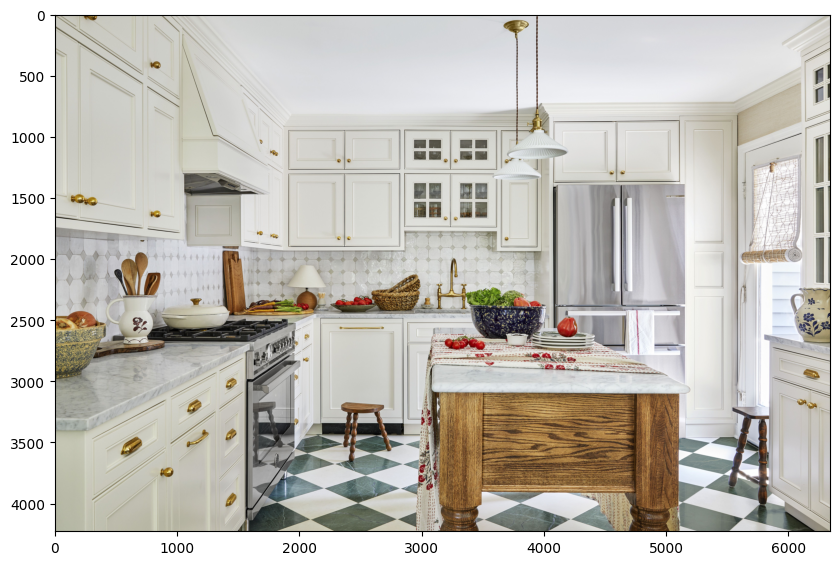

In [4]:
fn = "/tmp/kitchen.jpg"
!wget --user-agent='Mozilla 5.0' 'https://hips.hearstapps.com/hmg-prod/images/white-kitchen-tile-floor-663e73179c3c4.jpg' --output-document={fn}
kitchen = cv2.imread(fn)
cv2_imshow(kitchen)

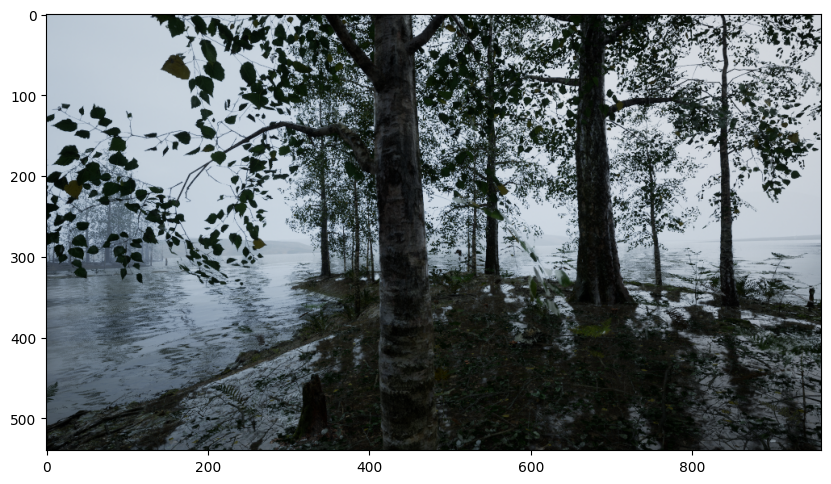

In [5]:
fn   = '/mnt/raid1/dataset/spread/spread-v2/birch-forest/rgb/Tree10011_1720527021.png'
tree = cv2.imread(fn)
cv2_imshow(tree)

#### Create a detectron2 config and a detectron2 DefaultPredictor to run inference on the images

In [6]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo.  https://github.com/facebookresearch/detectron2/blob/main/MODEL_ZOO.md
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(kitchen)

[01/14 19:37:19 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...


/mnt/raid1/venvs/sam2/lib/python3.12/site-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [7]:
# look at the outputs - tensors and bounding boxes.
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

tensor([44, 69, 56, 44, 44, 45, 60, 56, 45, 75, 45, 72, 41, 44, 47, 45, 58, 45,
        47, 72, 47, 46, 45], device='cuda:0')
Boxes(tensor([[6.5815e+02, 1.9479e+03, 7.6059e+02, 2.2956e+03],
        [7.9914e+02, 2.4244e+03, 1.9963e+03, 3.9455e+03],
        [2.3403e+03, 3.1646e+03, 2.7578e+03, 3.6395e+03],
        [4.8495e+02, 2.0909e+03, 5.8961e+02, 2.3047e+03],
        [5.4653e+02, 2.0054e+03, 6.7607e+02, 2.3027e+03],
        [5.5457e-01, 2.4994e+03, 4.1767e+02, 2.9753e+03],
        [2.9884e+03, 2.6632e+03, 5.1691e+03, 4.1879e+03],
        [5.5037e+03, 3.1771e+03, 5.8511e+03, 4.0149e+03],
        [2.2754e+03, 2.3646e+03, 2.6382e+03, 2.4396e+03],
        [6.0042e+03, 2.2164e+03, 6.3410e+03, 2.6818e+03],
        [3.3910e+03, 2.3489e+03, 4.0171e+03, 2.6853e+03],
        [4.1557e+03, 1.3937e+03, 5.1730e+03, 3.6036e+03],
        [4.2928e+02, 2.3030e+03, 8.3838e+02, 2.6952e+03],
        [7.2964e+02, 2.1157e+03, 8.5757e+02, 2.2967e+03],
        [1.9744e+03, 2.2680e+03, 2.1491e+03, 2.4199e+03]

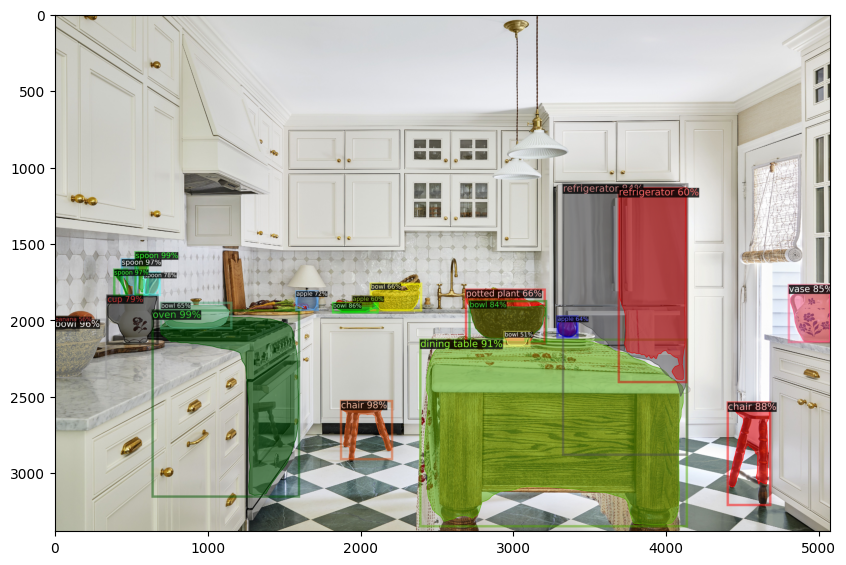

In [8]:
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(kitchen[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.8)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

#### Now that we know the model is working on a generic image, let's test the same model on one image from the SPREAD dataset...

Unfortunately the model __mask_rcnn_R_50_FPN_3x__ [has not been trained on trees](https://gist.github.com/AruniRC/7b3dadd004da04c80198557db5da4bda), so we can't expect great results.

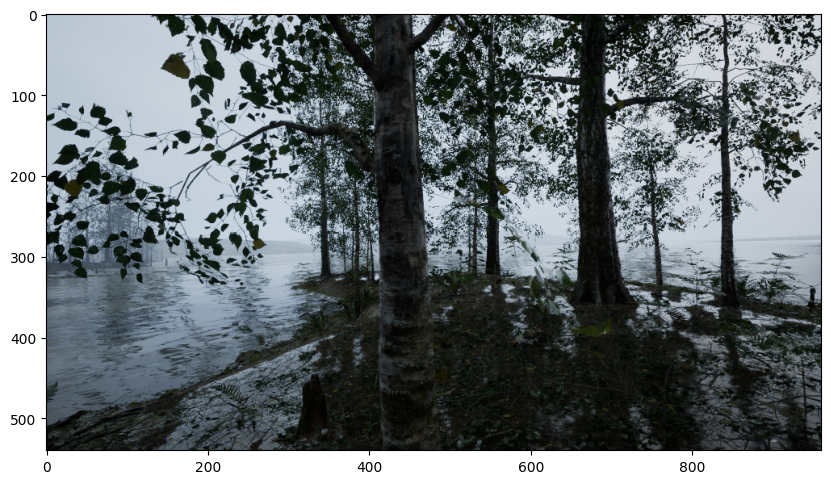

In [9]:
sci_outputs = predictor(tree)
sci_v = Visualizer(tree[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]))
sci_out = sci_v.draw_instance_predictions(sci_outputs["instances"].to("cpu"))
cv2_imshow(sci_out.get_image()[:, :, ::-1])

No detection at all. Now let's try to fine-tune one of the pretrained models with the SPREAD dataset...

# Train on a custom dataset

Import the necessary function to register datasets in the COCO format. We'll register both the training, validation and test sets. Please note that we are working with training and validation data that is already in the COCO format and that has been merged in a single JSON file (per each set) that describes all the annotations, including segmentation, from all the training images.

In [10]:
from detectron2.data.datasets import register_coco_instances
spread_dir = '/mnt/raid1/dataset/spread/spread-v2'
register_coco_instances("spread_train", {}, f"{spread_dir}/train.json", "/mnt/raid1/dataset/spread/spread-v2-coco")
register_coco_instances("spread_valid", {}, f"{spread_dir}/valid.json", "/mnt/raid1/dataset/spread/spread-v2-coco")
register_coco_instances("spread_test" , {}, f"{spread_dir}/test.json" , "/mnt/raid1/dataset/spread/spread-v2-coco")

Let us extract the metadata and dataset dictionaries for both training and validation datasets. These can be used later for other purposes, like visualization, model training, evaluation, etc. We will see a visualization example right away.

In [11]:
train_metadata      = MetadataCatalog.get("spread_train")
train_dataset_dicts = DatasetCatalog.get ("spread_train")

[01/14 19:37:37 d2.data.datasets.coco]: Loading /mnt/raid1/dataset/spread/spread-v2/train.json takes 14.47 seconds.
[01/14 19:37:37 d2.data.datasets.coco]: Loaded 8356 images in COCO format from /mnt/raid1/dataset/spread/spread-v2/train.json


In [12]:
val_metadata        = MetadataCatalog.get("spread_valid")
val_dataset_dicts   = DatasetCatalog.get ("spread_valid")

[01/14 19:37:44 d2.data.datasets.coco]: Loading /mnt/raid1/dataset/spread/spread-v2/valid.json takes 6.16 seconds.
[01/14 19:37:44 d2.data.datasets.coco]: Loaded 3042 images in COCO format from /mnt/raid1/dataset/spread/spread-v2/valid.json


In [13]:
test_metadata        = MetadataCatalog.get("spread_test")
test_dataset_dicts   = DatasetCatalog.get ("spread_test")

[01/14 19:37:50 d2.data.datasets.coco]: Loading /mnt/raid1/dataset/spread/spread-v2/test.json takes 2.91 seconds.
[01/14 19:37:50 d2.data.datasets.coco]: Loaded 1611 images in COCO format from /mnt/raid1/dataset/spread/spread-v2/test.json


In [14]:
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (18,10)

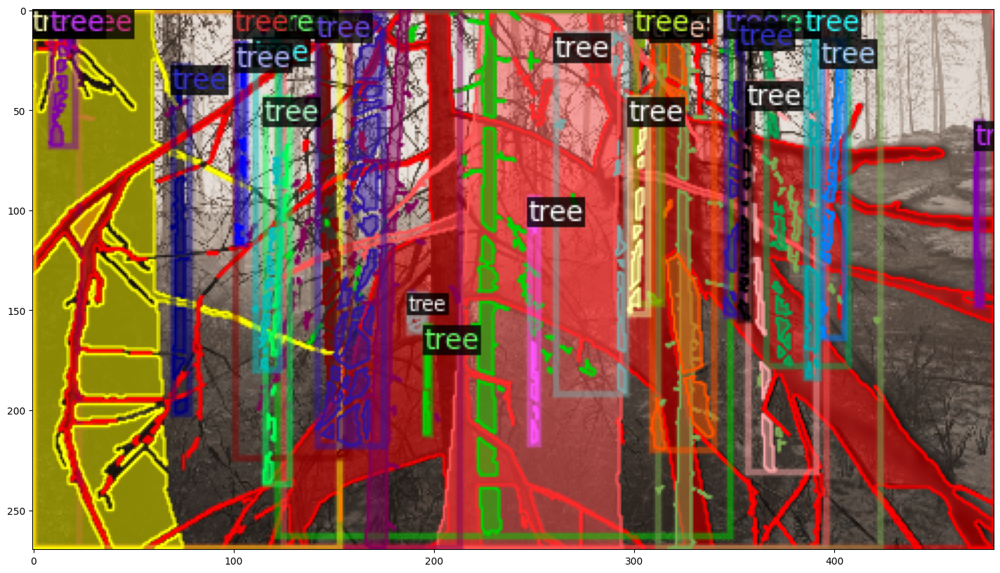

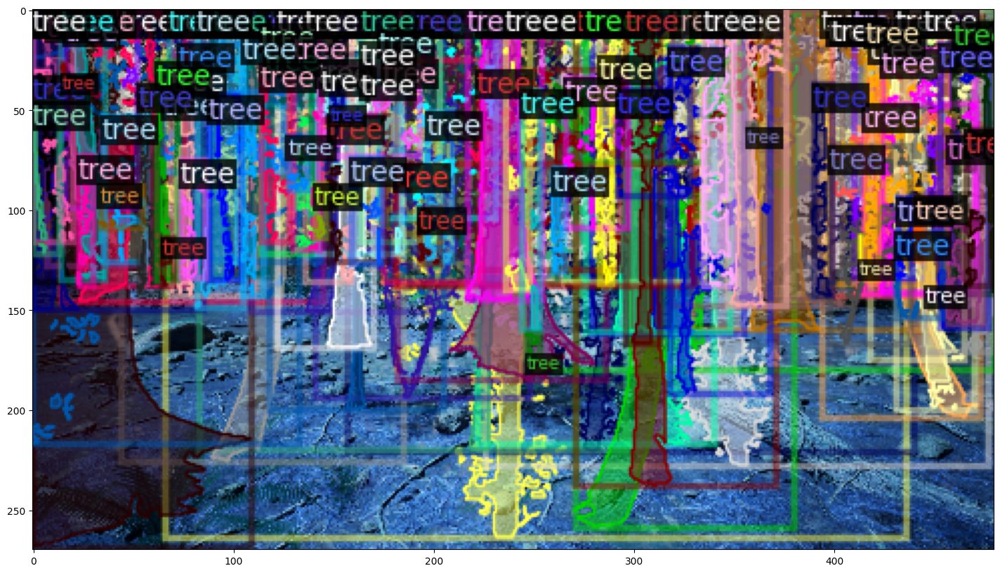

In [15]:
# Visualize some random samples
for d in random.sample(train_dataset_dicts, 2):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    plt.imshow(vis.get_image()[:, :, ::-1])
    plt.show(18,10)

# Train

Now we are ready to train a Mask R-CNN model using the Detectron2 library. We start by setting up a configuration file (.cfg) for the model. The configuration file contains many details including the output directory path, training dataset information, pre-trained weights, base learning rate, maximum number of iterations, etc.

In [16]:
from detectron2.engine import DefaultTrainer

model_name = 'mask_rcnn_R_101_DC5_3x'

cfg = get_cfg()
cfg.OUTPUT_DIR      = "/mnt/raid1/repos/maskdino/maskdino-output/" + model_name
cfg.merge_from_file(model_zoo.get_config_file(f"COCO-InstanceSegmentation/{model_name}.yaml"))
cfg.DATASETS.TRAIN  = ("spread_train",)
cfg.DATASETS.TEST   = ("spread_valid")
cfg.DATALOADER.NUM_WORKERS = 32
cfg.MODEL.WEIGHTS   = model_zoo.get_checkpoint_url(f"COCO-InstanceSegmentation/{model_name}.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 32  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR  = 0.0005   # pick a good LR
cfg.SOLVER.MAX_ITER = 20000    # 1000 iterations = 1.5 hours on RTX A6000
cfg.SOLVER.STEPS    = []       # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256   # Default is 512, using 256 for this dataset.
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # We have 1 classes.
# NOTE: this config means the number of classes, without the background. Do not use num_classes+1 here.

cfg.SOLVER.CHECKPOINT_PERIOD    = 500
cfg.SOLVER.REFERENCE_WORLD_SIZE = 2 # for dataparallel hopefully (nope, it doesn't work)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

trainer = DefaultTrainer(cfg) #Create an instance of of DefaultTrainer with the given congiguration
trainer.resume_or_load(resume=False) #Load a pretrained model if available (resume training) or start training from scratch if no pretrained model is available

[01/14 19:37:53 d2.engine.defaults]: Auto-scaling the config to batch_size=16, learning_rate=0.00025, max_iter=40000, warmup=2000.
[01/14 19:37:54 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(


[01/14 19:38:11 d2.data.datasets.coco]: Loading /mnt/raid1/dataset/spread/spread-v2/train.json takes 16.84 seconds.
[01/14 19:38:11 d2.data.datasets.coco]: Loaded 8356 images in COCO format from /mnt/raid1/dataset/spread/spread-v2/train.json
[01/14 19:38:12 d2.data.build]: Removed 0 images with no usable annotations. 8356 images left.
[01/14 19:38:12 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|    tree    | 291274       |
|            |              |
[01/14 19:38:12 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[01/14 19:38:12 d2.data.build]: Using training sampler TrainingSampler
[01/14 19:38:12 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[01/14 19:38:12 d2.data.common]: Serializing 8356 elements t

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in

In [17]:
_please_stop_here_with_an_error_

NameError: name '_please_stop_here_with_an_error_' is not defined

### Launch the training

In [18]:
trainer.train() #Start the training process

[01/14 19:45:02 d2.engine.train_loop]: Starting training from iteration 0
[01/14 19:45:46 d2.utils.events]:  eta: 20:21:18  iter: 19  total_loss: 7.071  loss_cls: 0.6095  loss_box_reg: 0.3099  loss_mask: 0.6905  loss_rpn_cls: 4.984  loss_rpn_loc: 0.4758    time: 1.8347  last_time: 1.9045  data_time: 0.3683  last_data_time: 0.0087   lr: 2.6226e-06  max_mem: 26377M
[01/14 19:46:24 d2.utils.events]:  eta: 20:38:25  iter: 39  total_loss: 6.508  loss_cls: 0.6025  loss_box_reg: 0.3872  loss_mask: 0.6813  loss_rpn_cls: 4.384  loss_rpn_loc: 0.4775    time: 1.8511  last_time: 1.9244  data_time: 0.0271  last_data_time: 0.0092   lr: 5.1201e-06  max_mem: 26377M
[01/14 19:47:04 d2.utils.events]:  eta: 20:58:44  iter: 59  total_loss: 5.503  loss_cls: 0.5997  loss_box_reg: 0.5507  loss_mask: 0.6641  loss_rpn_cls: 3.228  loss_rpn_loc: 0.4591    time: 1.8988  last_time: 1.9597  data_time: 0.0287  last_data_time: 0.0243   lr: 7.6176e-06  max_mem: 27541M
[01/14 19:47:44 d2.utils.events]:  eta: 21:18:04  

[01/14 20:04:50 d2.utils.events]:  eta: 23:15:43  iter: 559  total_loss: 2.194  loss_cls: 0.42  loss_box_reg: 0.8247  loss_mask: 0.3787  loss_rpn_cls: 0.2157  loss_rpn_loc: 0.3478    time: 2.1055  last_time: 2.1638  data_time: 0.0286  last_data_time: 0.0094   lr: 7.0055e-05  max_mem: 27608M
[01/14 20:05:32 d2.utils.events]:  eta: 23:15:10  iter: 579  total_loss: 2.17  loss_cls: 0.4162  loss_box_reg: 0.8223  loss_mask: 0.3875  loss_rpn_cls: 0.2115  loss_rpn_loc: 0.3469    time: 2.1060  last_time: 2.1504  data_time: 0.0299  last_data_time: 0.0112   lr: 7.2553e-05  max_mem: 27608M
[01/14 20:06:18 d2.utils.events]:  eta: 23:14:33  iter: 599  total_loss: 2.179  loss_cls: 0.4178  loss_box_reg: 0.8175  loss_mask: 0.3747  loss_rpn_cls: 0.2162  loss_rpn_loc: 0.3489    time: 2.1125  last_time: 2.2310  data_time: 0.0307  last_data_time: 0.0335   lr: 7.505e-05  max_mem: 27608M
[01/14 20:07:01 d2.utils.events]:  eta: 23:13:57  iter: 619  total_loss: 2.143  loss_cls: 0.4022  loss_box_reg: 0.8233  lo

[01/14 20:25:08 d2.utils.events]:  eta: 23:02:55  iter: 1119  total_loss: 2.023  loss_cls: 0.3918  loss_box_reg: 0.7714  loss_mask: 0.3331  loss_rpn_cls: 0.1875  loss_rpn_loc: 0.3246    time: 2.1241  last_time: 2.0975  data_time: 0.0320  last_data_time: 0.0376   lr: 0.00013999  max_mem: 27608M
[01/14 20:25:51 d2.utils.events]:  eta: 23:02:43  iter: 1139  total_loss: 1.975  loss_cls: 0.3895  loss_box_reg: 0.7552  loss_mask: 0.3292  loss_rpn_cls: 0.1879  loss_rpn_loc: 0.3221    time: 2.1245  last_time: 2.1474  data_time: 0.0301  last_data_time: 0.0280   lr: 0.00014248  max_mem: 27608M
[01/14 20:26:34 d2.utils.events]:  eta: 23:02:30  iter: 1159  total_loss: 1.942  loss_cls: 0.3782  loss_box_reg: 0.7473  loss_mask: 0.3164  loss_rpn_cls: 0.1809  loss_rpn_loc: 0.3175    time: 2.1246  last_time: 2.1807  data_time: 0.0310  last_data_time: 0.0283   lr: 0.00014498  max_mem: 27608M
[01/14 20:27:17 d2.utils.events]:  eta: 23:01:38  iter: 1179  total_loss: 1.968  loss_cls: 0.3741  loss_box_reg: 0.

[01/14 20:44:21 d2.utils.events]:  eta: 22:40:33  iter: 1659  total_loss: 1.93  loss_cls: 0.3706  loss_box_reg: 0.7265  loss_mask: 0.3119  loss_rpn_cls: 0.1868  loss_rpn_loc: 0.3143    time: 2.1269  last_time: 2.1873  data_time: 0.0309  last_data_time: 0.0118   lr: 0.00020742  max_mem: 27608M
[01/14 20:45:03 d2.utils.events]:  eta: 22:39:32  iter: 1679  total_loss: 1.885  loss_cls: 0.3651  loss_box_reg: 0.7257  loss_mask: 0.3096  loss_rpn_cls: 0.1771  loss_rpn_loc: 0.3092    time: 2.1267  last_time: 2.0927  data_time: 0.0293  last_data_time: 0.0119   lr: 0.00020992  max_mem: 27608M
[01/14 20:45:45 d2.utils.events]:  eta: 22:38:08  iter: 1699  total_loss: 1.903  loss_cls: 0.3662  loss_box_reg: 0.7206  loss_mask: 0.3083  loss_rpn_cls: 0.1829  loss_rpn_loc: 0.3088    time: 2.1264  last_time: 2.1335  data_time: 0.0279  last_data_time: 0.0240   lr: 0.00021241  max_mem: 27608M
[01/14 20:46:28 d2.utils.events]:  eta: 22:38:22  iter: 1719  total_loss: 1.903  loss_cls: 0.3829  loss_box_reg: 0.7

[01/14 21:04:33 d2.utils.events]:  eta: 22:20:18  iter: 2219  total_loss: 1.886  loss_cls: 0.3734  loss_box_reg: 0.7059  loss_mask: 0.3192  loss_rpn_cls: 0.1766  loss_rpn_loc: 0.312    time: 2.1290  last_time: 2.1685  data_time: 0.0313  last_data_time: 0.0484   lr: 0.00025  max_mem: 27608M
[01/14 21:05:16 d2.utils.events]:  eta: 22:19:42  iter: 2239  total_loss: 1.856  loss_cls: 0.3682  loss_box_reg: 0.7103  loss_mask: 0.3031  loss_rpn_cls: 0.1618  loss_rpn_loc: 0.3099    time: 2.1290  last_time: 2.1139  data_time: 0.0297  last_data_time: 0.0327   lr: 0.00025  max_mem: 27608M
[01/14 21:05:59 d2.utils.events]:  eta: 22:18:43  iter: 2259  total_loss: 1.892  loss_cls: 0.3698  loss_box_reg: 0.7108  loss_mask: 0.3034  loss_rpn_cls: 0.1768  loss_rpn_loc: 0.3196    time: 2.1291  last_time: 2.1441  data_time: 0.0360  last_data_time: 0.0589   lr: 0.00025  max_mem: 27608M
[01/14 21:06:41 d2.utils.events]:  eta: 22:17:42  iter: 2279  total_loss: 1.853  loss_cls: 0.3573  loss_box_reg: 0.7092  loss

[01/14 21:24:29 d2.utils.events]:  eta: 22:01:40  iter: 2779  total_loss: 1.801  loss_cls: 0.3519  loss_box_reg: 0.6887  loss_mask: 0.293  loss_rpn_cls: 0.162  loss_rpn_loc: 0.3017    time: 2.1299  last_time: 2.0876  data_time: 0.0301  last_data_time: 0.0315   lr: 0.00025  max_mem: 27608M
[01/14 21:25:11 d2.utils.events]:  eta: 22:00:31  iter: 2799  total_loss: 1.851  loss_cls: 0.3627  loss_box_reg: 0.6988  loss_mask: 0.3024  loss_rpn_cls: 0.1648  loss_rpn_loc: 0.3147    time: 2.1299  last_time: 2.1465  data_time: 0.0304  last_data_time: 0.0281   lr: 0.00025  max_mem: 27608M
[01/14 21:25:54 d2.utils.events]:  eta: 21:59:41  iter: 2819  total_loss: 1.794  loss_cls: 0.3501  loss_box_reg: 0.6862  loss_mask: 0.3044  loss_rpn_cls: 0.16  loss_rpn_loc: 0.3045    time: 2.1299  last_time: 2.1375  data_time: 0.0276  last_data_time: 0.0443   lr: 0.00025  max_mem: 27608M
[01/14 21:26:37 d2.utils.events]:  eta: 21:59:26  iter: 2839  total_loss: 1.835  loss_cls: 0.3591  loss_box_reg: 0.7056  loss_ma

[01/14 21:44:38 d2.utils.events]:  eta: 21:37:14  iter: 3339  total_loss: 1.778  loss_cls: 0.3506  loss_box_reg: 0.6843  loss_mask: 0.2941  loss_rpn_cls: 0.1547  loss_rpn_loc: 0.2934    time: 2.1298  last_time: 2.0883  data_time: 0.0298  last_data_time: 0.0242   lr: 0.00025  max_mem: 27608M
[01/14 21:45:20 d2.utils.events]:  eta: 21:36:12  iter: 3359  total_loss: 1.8  loss_cls: 0.3529  loss_box_reg: 0.7006  loss_mask: 0.3018  loss_rpn_cls: 0.16  loss_rpn_loc: 0.2956    time: 2.1297  last_time: 2.1270  data_time: 0.0288  last_data_time: 0.0306   lr: 0.00025  max_mem: 27608M
[01/14 21:46:03 d2.utils.events]:  eta: 21:35:18  iter: 3379  total_loss: 1.838  loss_cls: 0.3582  loss_box_reg: 0.6953  loss_mask: 0.2987  loss_rpn_cls: 0.1683  loss_rpn_loc: 0.3051    time: 2.1296  last_time: 2.1737  data_time: 0.0296  last_data_time: 0.0458   lr: 0.00025  max_mem: 27608M
[01/14 21:46:45 d2.utils.events]:  eta: 21:34:20  iter: 3399  total_loss: 1.805  loss_cls: 0.3521  loss_box_reg: 0.6886  loss_ma

[01/14 22:04:31 d2.utils.events]:  eta: 21:16:15  iter: 3899  total_loss: 1.796  loss_cls: 0.3462  loss_box_reg: 0.6804  loss_mask: 0.3099  loss_rpn_cls: 0.1614  loss_rpn_loc: 0.3024    time: 2.1295  last_time: 2.1457  data_time: 0.0278  last_data_time: 0.0296   lr: 0.00025  max_mem: 27608M
[01/14 22:05:13 d2.utils.events]:  eta: 21:15:33  iter: 3919  total_loss: 1.804  loss_cls: 0.3472  loss_box_reg: 0.6966  loss_mask: 0.2961  loss_rpn_cls: 0.1618  loss_rpn_loc: 0.3036    time: 2.1295  last_time: 2.1056  data_time: 0.0282  last_data_time: 0.0223   lr: 0.00025  max_mem: 27608M
[01/14 22:05:56 d2.utils.events]:  eta: 21:14:52  iter: 3939  total_loss: 1.773  loss_cls: 0.3415  loss_box_reg: 0.6776  loss_mask: 0.2927  loss_rpn_cls: 0.1598  loss_rpn_loc: 0.3062    time: 2.1294  last_time: 2.1297  data_time: 0.0261  last_data_time: 0.0171   lr: 0.00025  max_mem: 27608M
[01/14 22:06:38 d2.utils.events]:  eta: 21:14:10  iter: 3959  total_loss: 1.765  loss_cls: 0.3411  loss_box_reg: 0.674  loss

[01/14 22:24:37 d2.utils.events]:  eta: 20:56:11  iter: 4459  total_loss: 1.778  loss_cls: 0.3481  loss_box_reg: 0.6859  loss_mask: 0.2952  loss_rpn_cls: 0.1601  loss_rpn_loc: 0.2913    time: 2.1291  last_time: 2.0443  data_time: 0.0279  last_data_time: 0.0166   lr: 0.00025  max_mem: 27608M
[01/14 22:25:19 d2.utils.events]:  eta: 20:55:03  iter: 4479  total_loss: 1.782  loss_cls: 0.3491  loss_box_reg: 0.672  loss_mask: 0.299  loss_rpn_cls: 0.1608  loss_rpn_loc: 0.2965    time: 2.1291  last_time: 2.1746  data_time: 0.0304  last_data_time: 0.0344   lr: 0.00025  max_mem: 27608M
[01/14 22:26:01 d2.utils.events]:  eta: 20:54:26  iter: 4499  total_loss: 1.779  loss_cls: 0.3431  loss_box_reg: 0.6747  loss_mask: 0.3032  loss_rpn_cls: 0.1546  loss_rpn_loc: 0.2929    time: 2.1290  last_time: 2.1592  data_time: 0.0322  last_data_time: 0.0416   lr: 0.00025  max_mem: 27608M
[01/14 22:26:44 d2.utils.events]:  eta: 20:53:30  iter: 4519  total_loss: 1.79  loss_cls: 0.3477  loss_box_reg: 0.6782  loss_m

[01/14 22:44:43 d2.utils.events]:  eta: 20:36:53  iter: 5019  total_loss: 1.796  loss_cls: 0.354  loss_box_reg: 0.7  loss_mask: 0.2987  loss_rpn_cls: 0.1558  loss_rpn_loc: 0.2936    time: 2.1289  last_time: 2.0419  data_time: 0.0314  last_data_time: 0.0175   lr: 0.00025  max_mem: 27608M
[01/14 22:45:26 d2.utils.events]:  eta: 20:36:28  iter: 5039  total_loss: 1.771  loss_cls: 0.3441  loss_box_reg: 0.6849  loss_mask: 0.2887  loss_rpn_cls: 0.1569  loss_rpn_loc: 0.2981    time: 2.1289  last_time: 2.1251  data_time: 0.0297  last_data_time: 0.0255   lr: 0.00025  max_mem: 27608M
[01/14 22:46:08 d2.utils.events]:  eta: 20:35:42  iter: 5059  total_loss: 1.718  loss_cls: 0.3288  loss_box_reg: 0.6669  loss_mask: 0.2861  loss_rpn_cls: 0.1492  loss_rpn_loc: 0.2834    time: 2.1288  last_time: 2.1149  data_time: 0.0302  last_data_time: 0.0359   lr: 0.00025  max_mem: 27608M
[01/14 22:46:50 d2.utils.events]:  eta: 20:34:37  iter: 5079  total_loss: 1.753  loss_cls: 0.343  loss_box_reg: 0.6679  loss_mas

[01/14 23:04:35 d2.utils.events]:  eta: 20:16:17  iter: 5579  total_loss: 1.747  loss_cls: 0.3381  loss_box_reg: 0.6744  loss_mask: 0.2871  loss_rpn_cls: 0.1578  loss_rpn_loc: 0.2937    time: 2.1286  last_time: 2.0370  data_time: 0.0304  last_data_time: 0.0471   lr: 0.00025  max_mem: 27608M
[01/14 23:05:17 d2.utils.events]:  eta: 20:14:58  iter: 5599  total_loss: 1.801  loss_cls: 0.3484  loss_box_reg: 0.673  loss_mask: 0.2999  loss_rpn_cls: 0.1673  loss_rpn_loc: 0.3075    time: 2.1285  last_time: 2.1358  data_time: 0.0313  last_data_time: 0.0365   lr: 0.00025  max_mem: 27608M
[01/14 23:06:02 d2.utils.events]:  eta: 20:14:18  iter: 5619  total_loss: 1.799  loss_cls: 0.3484  loss_box_reg: 0.68  loss_mask: 0.2998  loss_rpn_cls: 0.1568  loss_rpn_loc: 0.3079    time: 2.1289  last_time: 2.1658  data_time: 0.0287  last_data_time: 0.0245   lr: 0.00025  max_mem: 27608M
[01/14 23:06:44 d2.utils.events]:  eta: 20:13:39  iter: 5639  total_loss: 1.775  loss_cls: 0.346  loss_box_reg: 0.6758  loss_ma

[01/14 23:24:40 d2.utils.events]:  eta: 19:53:32  iter: 6139  total_loss: 1.747  loss_cls: 0.3396  loss_box_reg: 0.6747  loss_mask: 0.2745  loss_rpn_cls: 0.1559  loss_rpn_loc: 0.2975    time: 2.1281  last_time: 2.0810  data_time: 0.0293  last_data_time: 0.0427   lr: 0.00025  max_mem: 27608M
[01/14 23:25:23 d2.utils.events]:  eta: 19:52:48  iter: 6159  total_loss: 1.78  loss_cls: 0.3509  loss_box_reg: 0.6819  loss_mask: 0.2946  loss_rpn_cls: 0.1522  loss_rpn_loc: 0.3006    time: 2.1281  last_time: 2.1295  data_time: 0.0292  last_data_time: 0.0635   lr: 0.00025  max_mem: 27608M
[01/14 23:26:05 d2.utils.events]:  eta: 19:52:05  iter: 6179  total_loss: 1.732  loss_cls: 0.3377  loss_box_reg: 0.6645  loss_mask: 0.2868  loss_rpn_cls: 0.1543  loss_rpn_loc: 0.2831    time: 2.1281  last_time: 2.0782  data_time: 0.0280  last_data_time: 0.0288   lr: 0.00025  max_mem: 27608M
[01/14 23:26:48 d2.utils.events]:  eta: 19:51:11  iter: 6199  total_loss: 1.736  loss_cls: 0.3336  loss_box_reg: 0.6619  loss

[01/14 23:44:31 d2.utils.events]:  eta: 19:33:57  iter: 6699  total_loss: 1.726  loss_cls: 0.336  loss_box_reg: 0.6754  loss_mask: 0.2831  loss_rpn_cls: 0.1506  loss_rpn_loc: 0.2862    time: 2.1278  last_time: 2.1028  data_time: 0.0300  last_data_time: 0.0453   lr: 0.00025  max_mem: 27608M
[01/14 23:45:13 d2.utils.events]:  eta: 19:33:37  iter: 6719  total_loss: 1.71  loss_cls: 0.3251  loss_box_reg: 0.657  loss_mask: 0.2922  loss_rpn_cls: 0.1534  loss_rpn_loc: 0.2809    time: 2.1278  last_time: 2.1496  data_time: 0.0291  last_data_time: 0.0363   lr: 0.00025  max_mem: 27608M
[01/14 23:45:56 d2.utils.events]:  eta: 19:33:00  iter: 6739  total_loss: 1.749  loss_cls: 0.3363  loss_box_reg: 0.6635  loss_mask: 0.2835  loss_rpn_cls: 0.1577  loss_rpn_loc: 0.2896    time: 2.1278  last_time: 2.0287  data_time: 0.0326  last_data_time: 0.0092   lr: 0.00025  max_mem: 27608M
[01/14 23:46:38 d2.utils.events]:  eta: 19:32:15  iter: 6759  total_loss: 1.78  loss_cls: 0.3418  loss_box_reg: 0.6723  loss_ma

[01/15 00:04:36 d2.utils.events]:  eta: 19:15:26  iter: 7259  total_loss: 1.724  loss_cls: 0.3323  loss_box_reg: 0.6652  loss_mask: 0.2913  loss_rpn_cls: 0.1496  loss_rpn_loc: 0.297    time: 2.1275  last_time: 2.1159  data_time: 0.0310  last_data_time: 0.0262   lr: 0.00025  max_mem: 27608M
[01/15 00:05:18 d2.utils.events]:  eta: 19:15:01  iter: 7279  total_loss: 1.73  loss_cls: 0.3327  loss_box_reg: 0.6517  loss_mask: 0.2872  loss_rpn_cls: 0.1526  loss_rpn_loc: 0.2865    time: 2.1275  last_time: 2.1223  data_time: 0.0288  last_data_time: 0.0327   lr: 0.00025  max_mem: 27608M
[01/15 00:06:01 d2.utils.events]:  eta: 19:14:19  iter: 7299  total_loss: 1.734  loss_cls: 0.3376  loss_box_reg: 0.6749  loss_mask: 0.2832  loss_rpn_cls: 0.1552  loss_rpn_loc: 0.2921    time: 2.1275  last_time: 2.0921  data_time: 0.0323  last_data_time: 0.0402   lr: 0.00025  max_mem: 27608M
[01/15 00:06:42 d2.utils.events]:  eta: 19:13:40  iter: 7319  total_loss: 1.738  loss_cls: 0.3341  loss_box_reg: 0.6626  loss_

[01/15 00:24:24 d2.utils.events]:  eta: 18:54:50  iter: 7819  total_loss: 1.794  loss_cls: 0.3446  loss_box_reg: 0.6728  loss_mask: 0.293  loss_rpn_cls: 0.1617  loss_rpn_loc: 0.2994    time: 2.1270  last_time: 2.1394  data_time: 0.0293  last_data_time: 0.0463   lr: 0.00025  max_mem: 27608M
[01/15 00:25:06 d2.utils.events]:  eta: 18:54:06  iter: 7839  total_loss: 1.782  loss_cls: 0.3433  loss_box_reg: 0.6735  loss_mask: 0.2963  loss_rpn_cls: 0.1616  loss_rpn_loc: 0.2958    time: 2.1269  last_time: 2.1090  data_time: 0.0295  last_data_time: 0.0489   lr: 0.00025  max_mem: 27608M
[01/15 00:25:48 d2.utils.events]:  eta: 18:53:19  iter: 7859  total_loss: 1.729  loss_cls: 0.3387  loss_box_reg: 0.6799  loss_mask: 0.2859  loss_rpn_cls: 0.1542  loss_rpn_loc: 0.2874    time: 2.1269  last_time: 2.1106  data_time: 0.0316  last_data_time: 0.0271   lr: 0.00025  max_mem: 27608M
[01/15 00:26:31 d2.utils.events]:  eta: 18:52:36  iter: 7879  total_loss: 1.756  loss_cls: 0.3395  loss_box_reg: 0.6707  loss

[01/15 00:44:25 d2.utils.events]:  eta: 18:33:21  iter: 8379  total_loss: 1.72  loss_cls: 0.3282  loss_box_reg: 0.665  loss_mask: 0.2938  loss_rpn_cls: 0.1543  loss_rpn_loc: 0.289    time: 2.1264  last_time: 2.0828  data_time: 0.0273  last_data_time: 0.0245   lr: 0.00025  max_mem: 27608M
[01/15 00:45:08 d2.utils.events]:  eta: 18:32:29  iter: 8399  total_loss: 1.718  loss_cls: 0.3295  loss_box_reg: 0.6582  loss_mask: 0.2856  loss_rpn_cls: 0.1496  loss_rpn_loc: 0.2839    time: 2.1264  last_time: 2.1572  data_time: 0.0298  last_data_time: 0.0292   lr: 0.00025  max_mem: 27608M
[01/15 00:45:50 d2.utils.events]:  eta: 18:31:40  iter: 8419  total_loss: 1.689  loss_cls: 0.3216  loss_box_reg: 0.6602  loss_mask: 0.2852  loss_rpn_cls: 0.1465  loss_rpn_loc: 0.2859    time: 2.1264  last_time: 2.1749  data_time: 0.0296  last_data_time: 0.0463   lr: 0.00025  max_mem: 27608M
[01/15 00:46:32 d2.utils.events]:  eta: 18:31:01  iter: 8439  total_loss: 1.759  loss_cls: 0.3387  loss_box_reg: 0.6771  loss_m

[01/15 01:04:12 d2.utils.events]:  eta: 18:12:48  iter: 8939  total_loss: 1.735  loss_cls: 0.336  loss_box_reg: 0.6645  loss_mask: 0.2894  loss_rpn_cls: 0.1557  loss_rpn_loc: 0.3005    time: 2.1258  last_time: 2.1558  data_time: 0.0306  last_data_time: 0.0714   lr: 0.00025  max_mem: 27608M
[01/15 01:04:54 d2.utils.events]:  eta: 18:12:03  iter: 8959  total_loss: 1.747  loss_cls: 0.3375  loss_box_reg: 0.6712  loss_mask: 0.2886  loss_rpn_cls: 0.1528  loss_rpn_loc: 0.2953    time: 2.1258  last_time: 2.1160  data_time: 0.0297  last_data_time: 0.0298   lr: 0.00025  max_mem: 27608M
[01/15 01:05:36 d2.utils.events]:  eta: 18:11:19  iter: 8979  total_loss: 1.711  loss_cls: 0.3321  loss_box_reg: 0.6632  loss_mask: 0.2741  loss_rpn_cls: 0.1523  loss_rpn_loc: 0.2932    time: 2.1257  last_time: 2.0629  data_time: 0.0309  last_data_time: 0.0318   lr: 0.00025  max_mem: 27608M
[01/15 01:06:32 d2.utils.events]:  eta: 18:10:34  iter: 8999  total_loss: 1.746  loss_cls: 0.3383  loss_box_reg: 0.6686  loss

[01/15 01:24:09 d2.utils.events]:  eta: 17:51:21  iter: 9499  total_loss: 1.673  loss_cls: 0.3197  loss_box_reg: 0.6525  loss_mask: 0.2857  loss_rpn_cls: 0.1512  loss_rpn_loc: 0.2793    time: 2.1250  last_time: 2.1282  data_time: 0.0342  last_data_time: 0.0671   lr: 0.00025  max_mem: 27608M
[01/15 01:24:51 d2.utils.events]:  eta: 17:50:39  iter: 9519  total_loss: 1.744  loss_cls: 0.3367  loss_box_reg: 0.6704  loss_mask: 0.2913  loss_rpn_cls: 0.1483  loss_rpn_loc: 0.3025    time: 2.1250  last_time: 2.1200  data_time: 0.0296  last_data_time: 0.0625   lr: 0.00025  max_mem: 27608M
[01/15 01:25:33 d2.utils.events]:  eta: 17:49:53  iter: 9539  total_loss: 1.696  loss_cls: 0.3338  loss_box_reg: 0.6725  loss_mask: 0.2764  loss_rpn_cls: 0.1483  loss_rpn_loc: 0.2821    time: 2.1249  last_time: 2.1617  data_time: 0.0292  last_data_time: 0.0848   lr: 0.00025  max_mem: 27608M
[01/15 01:26:15 d2.utils.events]:  eta: 17:49:11  iter: 9559  total_loss: 1.723  loss_cls: 0.3359  loss_box_reg: 0.669  loss

[01/15 01:44:11 d2.utils.events]:  eta: 17:31:40  iter: 10059  total_loss: 1.708  loss_cls: 0.334  loss_box_reg: 0.648  loss_mask: 0.2886  loss_rpn_cls: 0.1576  loss_rpn_loc: 0.2901    time: 2.1246  last_time: 2.1108  data_time: 0.0310  last_data_time: 0.0460   lr: 0.00025  max_mem: 27608M
[01/15 01:44:54 d2.utils.events]:  eta: 17:30:57  iter: 10079  total_loss: 1.749  loss_cls: 0.3368  loss_box_reg: 0.6645  loss_mask: 0.2818  loss_rpn_cls: 0.1582  loss_rpn_loc: 0.2954    time: 2.1245  last_time: 2.1519  data_time: 0.0299  last_data_time: 0.0469   lr: 0.00025  max_mem: 27608M
[01/15 01:45:36 d2.utils.events]:  eta: 17:30:22  iter: 10099  total_loss: 1.724  loss_cls: 0.3327  loss_box_reg: 0.6586  loss_mask: 0.2871  loss_rpn_cls: 0.1458  loss_rpn_loc: 0.2888    time: 2.1245  last_time: 2.1262  data_time: 0.0290  last_data_time: 0.0595   lr: 0.00025  max_mem: 27608M
[01/15 01:46:18 d2.utils.events]:  eta: 17:29:43  iter: 10119  total_loss: 1.752  loss_cls: 0.3424  loss_box_reg: 0.6661  l

[01/15 02:03:57 d2.utils.events]:  eta: 17:13:08  iter: 10619  total_loss: 1.694  loss_cls: 0.3278  loss_box_reg: 0.6473  loss_mask: 0.2797  loss_rpn_cls: 0.1551  loss_rpn_loc: 0.2839    time: 2.1241  last_time: 2.0810  data_time: 0.0349  last_data_time: 0.0116   lr: 0.00025  max_mem: 27608M
[01/15 02:04:39 d2.utils.events]:  eta: 17:12:26  iter: 10639  total_loss: 1.678  loss_cls: 0.3249  loss_box_reg: 0.6492  loss_mask: 0.2804  loss_rpn_cls: 0.1463  loss_rpn_loc: 0.2803    time: 2.1241  last_time: 2.0835  data_time: 0.0308  last_data_time: 0.0252   lr: 0.00025  max_mem: 27608M
[01/15 02:05:24 d2.utils.events]:  eta: 17:11:37  iter: 10659  total_loss: 1.7  loss_cls: 0.3284  loss_box_reg: 0.6524  loss_mask: 0.2919  loss_rpn_cls: 0.1572  loss_rpn_loc: 0.2881    time: 2.1243  last_time: 2.1593  data_time: 0.0303  last_data_time: 0.0359   lr: 0.00025  max_mem: 27608M
[01/15 02:06:06 d2.utils.events]:  eta: 17:11:07  iter: 10679  total_loss: 1.698  loss_cls: 0.3262  loss_box_reg: 0.6528  l

[01/15 02:23:58 d2.utils.events]:  eta: 16:50:49  iter: 11179  total_loss: 1.699  loss_cls: 0.3198  loss_box_reg: 0.6472  loss_mask: 0.2796  loss_rpn_cls: 0.1454  loss_rpn_loc: 0.29    time: 2.1237  last_time: 2.0818  data_time: 0.0305  last_data_time: 0.0250   lr: 0.00025  max_mem: 27608M
[01/15 02:24:41 d2.utils.events]:  eta: 16:50:13  iter: 11199  total_loss: 1.687  loss_cls: 0.3234  loss_box_reg: 0.6552  loss_mask: 0.2763  loss_rpn_cls: 0.1504  loss_rpn_loc: 0.2884    time: 2.1237  last_time: 2.1866  data_time: 0.0299  last_data_time: 0.0346   lr: 0.00025  max_mem: 27608M
[01/15 02:25:23 d2.utils.events]:  eta: 16:49:22  iter: 11219  total_loss: 1.726  loss_cls: 0.3258  loss_box_reg: 0.6601  loss_mask: 0.2892  loss_rpn_cls: 0.1513  loss_rpn_loc: 0.2945    time: 2.1236  last_time: 2.0603  data_time: 0.0287  last_data_time: 0.0095   lr: 0.00025  max_mem: 27608M
[01/15 02:26:05 d2.utils.events]:  eta: 16:48:27  iter: 11239  total_loss: 1.66  loss_cls: 0.3202  loss_box_reg: 0.6578  lo

[01/15 02:43:43 d2.utils.events]:  eta: 16:31:26  iter: 11739  total_loss: 1.721  loss_cls: 0.3322  loss_box_reg: 0.6635  loss_mask: 0.2837  loss_rpn_cls: 0.1439  loss_rpn_loc: 0.2887    time: 2.1231  last_time: 2.2026  data_time: 0.0353  last_data_time: 0.0611   lr: 0.00025  max_mem: 27608M
[01/15 02:44:25 d2.utils.events]:  eta: 16:30:48  iter: 11759  total_loss: 1.655  loss_cls: 0.322  loss_box_reg: 0.6504  loss_mask: 0.2728  loss_rpn_cls: 0.1484  loss_rpn_loc: 0.2935    time: 2.1231  last_time: 2.0711  data_time: 0.0359  last_data_time: 0.0106   lr: 0.00025  max_mem: 27608M
[01/15 02:45:07 d2.utils.events]:  eta: 16:30:06  iter: 11779  total_loss: 1.733  loss_cls: 0.3257  loss_box_reg: 0.6588  loss_mask: 0.2977  loss_rpn_cls: 0.147  loss_rpn_loc: 0.2899    time: 2.1231  last_time: 2.0998  data_time: 0.0287  last_data_time: 0.0309   lr: 0.00025  max_mem: 27608M
[01/15 02:45:49 d2.utils.events]:  eta: 16:29:20  iter: 11799  total_loss: 1.68  loss_cls: 0.3194  loss_box_reg: 0.6582  lo

[01/15 03:03:43 d2.utils.events]:  eta: 16:11:34  iter: 12299  total_loss: 1.721  loss_cls: 0.3384  loss_box_reg: 0.665  loss_mask: 0.2878  loss_rpn_cls: 0.1539  loss_rpn_loc: 0.2901    time: 2.1225  last_time: 2.0799  data_time: 0.0321  last_data_time: 0.0133   lr: 0.00025  max_mem: 27608M
[01/15 03:04:26 d2.utils.events]:  eta: 16:10:47  iter: 12319  total_loss: 1.746  loss_cls: 0.335  loss_box_reg: 0.6661  loss_mask: 0.2779  loss_rpn_cls: 0.154  loss_rpn_loc: 0.2912    time: 2.1225  last_time: 2.1181  data_time: 0.0310  last_data_time: 0.0223   lr: 0.00025  max_mem: 27608M
[01/15 03:05:07 d2.utils.events]:  eta: 16:10:00  iter: 12339  total_loss: 1.679  loss_cls: 0.3233  loss_box_reg: 0.6459  loss_mask: 0.2898  loss_rpn_cls: 0.148  loss_rpn_loc: 0.2861    time: 2.1224  last_time: 2.0346  data_time: 0.0304  last_data_time: 0.0102   lr: 0.00025  max_mem: 27608M
[01/15 03:05:49 d2.utils.events]:  eta: 16:09:09  iter: 12359  total_loss: 1.671  loss_cls: 0.3202  loss_box_reg: 0.6343  los

[01/15 03:23:26 d2.utils.events]:  eta: 15:51:04  iter: 12859  total_loss: 1.711  loss_cls: 0.3285  loss_box_reg: 0.6446  loss_mask: 0.2811  loss_rpn_cls: 0.153  loss_rpn_loc: 0.2891    time: 2.1219  last_time: 2.0891  data_time: 0.0291  last_data_time: 0.0310   lr: 0.00025  max_mem: 27608M
[01/15 03:24:08 d2.utils.events]:  eta: 15:50:31  iter: 12879  total_loss: 1.641  loss_cls: 0.3217  loss_box_reg: 0.6381  loss_mask: 0.2744  loss_rpn_cls: 0.1434  loss_rpn_loc: 0.2788    time: 2.1219  last_time: 2.1098  data_time: 0.0269  last_data_time: 0.0096   lr: 0.00025  max_mem: 27608M
[01/15 03:24:50 d2.utils.events]:  eta: 15:50:00  iter: 12899  total_loss: 1.704  loss_cls: 0.3341  loss_box_reg: 0.677  loss_mask: 0.2756  loss_rpn_cls: 0.1468  loss_rpn_loc: 0.2898    time: 2.1219  last_time: 2.0792  data_time: 0.0306  last_data_time: 0.0104   lr: 0.00025  max_mem: 27608M
[01/15 03:25:33 d2.utils.events]:  eta: 15:49:29  iter: 12919  total_loss: 1.722  loss_cls: 0.3317  loss_box_reg: 0.655  lo

[01/15 03:43:24 d2.utils.events]:  eta: 15:31:51  iter: 13419  total_loss: 1.709  loss_cls: 0.332  loss_box_reg: 0.654  loss_mask: 0.2844  loss_rpn_cls: 0.15  loss_rpn_loc: 0.2809    time: 2.1215  last_time: 2.0863  data_time: 0.0292  last_data_time: 0.0095   lr: 0.00025  max_mem: 27608M
[01/15 03:44:06 d2.utils.events]:  eta: 15:31:14  iter: 13439  total_loss: 1.697  loss_cls: 0.3224  loss_box_reg: 0.6465  loss_mask: 0.2832  loss_rpn_cls: 0.1552  loss_rpn_loc: 0.2913    time: 2.1215  last_time: 2.1205  data_time: 0.0308  last_data_time: 0.0122   lr: 0.00025  max_mem: 27608M
[01/15 03:44:49 d2.utils.events]:  eta: 15:30:16  iter: 13459  total_loss: 1.648  loss_cls: 0.3153  loss_box_reg: 0.6438  loss_mask: 0.2796  loss_rpn_cls: 0.1394  loss_rpn_loc: 0.2692    time: 2.1215  last_time: 2.0995  data_time: 0.0291  last_data_time: 0.0266   lr: 0.00025  max_mem: 27608M
[01/15 03:45:31 d2.utils.events]:  eta: 15:29:50  iter: 13479  total_loss: 1.741  loss_cls: 0.3394  loss_box_reg: 0.6561  los

[01/15 04:03:07 d2.utils.events]:  eta: 15:11:27  iter: 13979  total_loss: 1.735  loss_cls: 0.3325  loss_box_reg: 0.6567  loss_mask: 0.2843  loss_rpn_cls: 0.1549  loss_rpn_loc: 0.2922    time: 2.1211  last_time: 2.1558  data_time: 0.0300  last_data_time: 0.0567   lr: 0.00025  max_mem: 27608M
[01/15 04:04:06 d2.utils.events]:  eta: 15:10:45  iter: 13999  total_loss: 1.659  loss_cls: 0.3173  loss_box_reg: 0.6348  loss_mask: 0.2901  loss_rpn_cls: 0.1483  loss_rpn_loc: 0.2807    time: 2.1211  last_time: 2.1232  data_time: 0.0286  last_data_time: 0.0548   lr: 0.00025  max_mem: 27608M
[01/15 04:04:48 d2.utils.events]:  eta: 15:09:55  iter: 14019  total_loss: 1.689  loss_cls: 0.3264  loss_box_reg: 0.6534  loss_mask: 0.2746  loss_rpn_cls: 0.1453  loss_rpn_loc: 0.279    time: 2.1210  last_time: 2.1435  data_time: 0.0293  last_data_time: 0.0313   lr: 0.00025  max_mem: 27608M
[01/15 04:05:30 d2.utils.events]:  eta: 15:09:13  iter: 14039  total_loss: 1.666  loss_cls: 0.3231  loss_box_reg: 0.6336  

[01/15 04:23:05 d2.utils.events]:  eta: 14:51:37  iter: 14539  total_loss: 1.705  loss_cls: 0.3285  loss_box_reg: 0.6632  loss_mask: 0.2773  loss_rpn_cls: 0.1466  loss_rpn_loc: 0.2894    time: 2.1206  last_time: 2.0682  data_time: 0.0317  last_data_time: 0.0306   lr: 0.00025  max_mem: 27608M
[01/15 04:23:47 d2.utils.events]:  eta: 14:50:51  iter: 14559  total_loss: 1.648  loss_cls: 0.3177  loss_box_reg: 0.6321  loss_mask: 0.2718  loss_rpn_cls: 0.1453  loss_rpn_loc: 0.277    time: 2.1205  last_time: 2.0773  data_time: 0.0295  last_data_time: 0.0102   lr: 0.00025  max_mem: 27608M
[01/15 04:24:29 d2.utils.events]:  eta: 14:50:11  iter: 14579  total_loss: 1.693  loss_cls: 0.3252  loss_box_reg: 0.6543  loss_mask: 0.2729  loss_rpn_cls: 0.151  loss_rpn_loc: 0.2826    time: 2.1205  last_time: 2.1368  data_time: 0.0306  last_data_time: 0.0093   lr: 0.00025  max_mem: 27608M
[01/15 04:25:11 d2.utils.events]:  eta: 14:49:26  iter: 14599  total_loss: 1.659  loss_cls: 0.3241  loss_box_reg: 0.6339  l

[01/15 04:43:00 d2.utils.events]:  eta: 14:31:25  iter: 15099  total_loss: 1.723  loss_cls: 0.3348  loss_box_reg: 0.6501  loss_mask: 0.2743  loss_rpn_cls: 0.1526  loss_rpn_loc: 0.2931    time: 2.1201  last_time: 2.0584  data_time: 0.0300  last_data_time: 0.0099   lr: 0.00025  max_mem: 27608M
[01/15 04:43:42 d2.utils.events]:  eta: 14:30:58  iter: 15119  total_loss: 1.694  loss_cls: 0.321  loss_box_reg: 0.641  loss_mask: 0.2866  loss_rpn_cls: 0.1467  loss_rpn_loc: 0.2888    time: 2.1201  last_time: 2.1483  data_time: 0.0304  last_data_time: 0.0298   lr: 0.00025  max_mem: 27608M
[01/15 04:44:24 d2.utils.events]:  eta: 14:30:24  iter: 15139  total_loss: 1.655  loss_cls: 0.3213  loss_box_reg: 0.6391  loss_mask: 0.277  loss_rpn_cls: 0.1529  loss_rpn_loc: 0.28    time: 2.1200  last_time: 2.1798  data_time: 0.0320  last_data_time: 0.0365   lr: 0.00025  max_mem: 27608M
[01/15 04:45:07 d2.utils.events]:  eta: 14:29:49  iter: 15159  total_loss: 1.696  loss_cls: 0.3211  loss_box_reg: 0.6531  loss

[01/15 05:02:44 d2.utils.events]:  eta: 14:14:15  iter: 15659  total_loss: 1.659  loss_cls: 0.3191  loss_box_reg: 0.6494  loss_mask: 0.2743  loss_rpn_cls: 0.1392  loss_rpn_loc: 0.2842    time: 2.1198  last_time: 2.2105  data_time: 0.0299  last_data_time: 0.0270   lr: 0.00025  max_mem: 27608M
[01/15 05:03:29 d2.utils.events]:  eta: 14:13:25  iter: 15679  total_loss: 1.714  loss_cls: 0.3326  loss_box_reg: 0.6606  loss_mask: 0.2823  loss_rpn_cls: 0.1529  loss_rpn_loc: 0.277    time: 2.1200  last_time: 4.8071  data_time: 0.0331  last_data_time: 0.0859   lr: 0.00025  max_mem: 27608M
[01/15 05:04:11 d2.utils.events]:  eta: 14:12:25  iter: 15699  total_loss: 1.669  loss_cls: 0.3271  loss_box_reg: 0.6511  loss_mask: 0.2762  loss_rpn_cls: 0.1475  loss_rpn_loc: 0.2856    time: 2.1200  last_time: 2.0614  data_time: 0.0354  last_data_time: 0.0128   lr: 0.00025  max_mem: 27608M
[01/15 05:04:54 d2.utils.events]:  eta: 14:12:01  iter: 15719  total_loss: 1.681  loss_cls: 0.3226  loss_box_reg: 0.6463  

[01/15 05:22:43 d2.utils.events]:  eta: 13:53:57  iter: 16219  total_loss: 1.674  loss_cls: 0.3182  loss_box_reg: 0.6439  loss_mask: 0.2801  loss_rpn_cls: 0.1486  loss_rpn_loc: 0.287    time: 2.1196  last_time: 2.1623  data_time: 0.0288  last_data_time: 0.0249   lr: 0.00025  max_mem: 27608M
[01/15 05:23:25 d2.utils.events]:  eta: 13:52:45  iter: 16239  total_loss: 1.654  loss_cls: 0.3252  loss_box_reg: 0.6348  loss_mask: 0.2735  loss_rpn_cls: 0.1477  loss_rpn_loc: 0.2746    time: 2.1195  last_time: 2.0804  data_time: 0.0297  last_data_time: 0.0275   lr: 0.00025  max_mem: 27608M
[01/15 05:24:07 d2.utils.events]:  eta: 13:51:36  iter: 16259  total_loss: 1.646  loss_cls: 0.3079  loss_box_reg: 0.6321  loss_mask: 0.2693  loss_rpn_cls: 0.1424  loss_rpn_loc: 0.2826    time: 2.1195  last_time: 2.0593  data_time: 0.0305  last_data_time: 0.0348   lr: 0.00025  max_mem: 27608M
[01/15 05:24:48 d2.utils.events]:  eta: 13:50:46  iter: 16279  total_loss: 1.684  loss_cls: 0.3237  loss_box_reg: 0.6351  

[01/15 05:42:25 d2.utils.events]:  eta: 13:32:32  iter: 16779  total_loss: 1.742  loss_cls: 0.3324  loss_box_reg: 0.6513  loss_mask: 0.2869  loss_rpn_cls: 0.1471  loss_rpn_loc: 0.2993    time: 2.1192  last_time: 2.1108  data_time: 0.0289  last_data_time: 0.0190   lr: 0.00025  max_mem: 27608M
[01/15 05:43:07 d2.utils.events]:  eta: 13:32:00  iter: 16799  total_loss: 1.676  loss_cls: 0.3212  loss_box_reg: 0.6464  loss_mask: 0.2789  loss_rpn_cls: 0.1435  loss_rpn_loc: 0.2929    time: 2.1192  last_time: 2.1410  data_time: 0.0355  last_data_time: 0.0586   lr: 0.00025  max_mem: 27608M
[01/15 05:43:50 d2.utils.events]:  eta: 13:31:17  iter: 16819  total_loss: 1.687  loss_cls: 0.3252  loss_box_reg: 0.6517  loss_mask: 0.2832  loss_rpn_cls: 0.1506  loss_rpn_loc: 0.283    time: 2.1192  last_time: 2.0669  data_time: 0.0300  last_data_time: 0.0118   lr: 0.00025  max_mem: 27608M
[01/15 05:44:32 d2.utils.events]:  eta: 13:30:42  iter: 16839  total_loss: 1.67  loss_cls: 0.3183  loss_box_reg: 0.6401  l

[01/15 06:02:22 d2.utils.events]:  eta: 13:14:07  iter: 17339  total_loss: 1.69  loss_cls: 0.3163  loss_box_reg: 0.6348  loss_mask: 0.2769  loss_rpn_cls: 0.152  loss_rpn_loc: 0.2853    time: 2.1189  last_time: 2.0460  data_time: 0.0279  last_data_time: 0.0434   lr: 0.00025  max_mem: 27608M
[01/15 06:03:04 d2.utils.events]:  eta: 13:13:25  iter: 17359  total_loss: 1.673  loss_cls: 0.3211  loss_box_reg: 0.6331  loss_mask: 0.2761  loss_rpn_cls: 0.1484  loss_rpn_loc: 0.2682    time: 2.1189  last_time: 2.1034  data_time: 0.0296  last_data_time: 0.0385   lr: 0.00025  max_mem: 27608M
[01/15 06:03:46 d2.utils.events]:  eta: 13:12:43  iter: 17379  total_loss: 1.658  loss_cls: 0.3268  loss_box_reg: 0.6512  loss_mask: 0.282  loss_rpn_cls: 0.1484  loss_rpn_loc: 0.2795    time: 2.1189  last_time: 2.0660  data_time: 0.0288  last_data_time: 0.0349   lr: 0.00025  max_mem: 27608M
[01/15 06:04:28 d2.utils.events]:  eta: 13:11:59  iter: 17399  total_loss: 1.672  loss_cls: 0.3198  loss_box_reg: 0.6482  lo

[01/15 06:22:02 d2.utils.events]:  eta: 12:54:08  iter: 17899  total_loss: 1.63  loss_cls: 0.3188  loss_box_reg: 0.6433  loss_mask: 0.2719  loss_rpn_cls: 0.1478  loss_rpn_loc: 0.271    time: 2.1185  last_time: 2.0898  data_time: 0.0310  last_data_time: 0.0310   lr: 0.00025  max_mem: 27608M
[01/15 06:22:44 d2.utils.events]:  eta: 12:53:22  iter: 17919  total_loss: 1.696  loss_cls: 0.3254  loss_box_reg: 0.6463  loss_mask: 0.2794  loss_rpn_cls: 0.147  loss_rpn_loc: 0.2896    time: 2.1184  last_time: 2.1254  data_time: 0.0305  last_data_time: 0.0328   lr: 0.00025  max_mem: 27608M
[01/15 06:23:26 d2.utils.events]:  eta: 12:52:40  iter: 17939  total_loss: 1.609  loss_cls: 0.3044  loss_box_reg: 0.6171  loss_mask: 0.2667  loss_rpn_cls: 0.1382  loss_rpn_loc: 0.2729    time: 2.1184  last_time: 2.1116  data_time: 0.0292  last_data_time: 0.0294   lr: 0.00025  max_mem: 27608M
[01/15 06:24:08 d2.utils.events]:  eta: 12:52:02  iter: 17959  total_loss: 1.715  loss_cls: 0.3314  loss_box_reg: 0.6418  lo

[01/15 06:41:57 d2.utils.events]:  eta: 12:33:16  iter: 18459  total_loss: 1.655  loss_cls: 0.3128  loss_box_reg: 0.6256  loss_mask: 0.28  loss_rpn_cls: 0.1444  loss_rpn_loc: 0.2739    time: 2.1181  last_time: 2.0872  data_time: 0.0294  last_data_time: 0.0293   lr: 0.00025  max_mem: 27608M
[01/15 06:42:39 d2.utils.events]:  eta: 12:32:34  iter: 18479  total_loss: 1.704  loss_cls: 0.3276  loss_box_reg: 0.655  loss_mask: 0.2876  loss_rpn_cls: 0.1511  loss_rpn_loc: 0.2849    time: 2.1181  last_time: 2.1008  data_time: 0.0309  last_data_time: 0.0098   lr: 0.00025  max_mem: 27608M
[01/15 06:43:21 d2.utils.events]:  eta: 12:31:52  iter: 18499  total_loss: 1.624  loss_cls: 0.3108  loss_box_reg: 0.6389  loss_mask: 0.261  loss_rpn_cls: 0.1388  loss_rpn_loc: 0.268    time: 2.1181  last_time: 2.1202  data_time: 0.0292  last_data_time: 0.0372   lr: 0.00025  max_mem: 27608M
[01/15 06:44:04 d2.utils.events]:  eta: 12:31:27  iter: 18519  total_loss: 1.664  loss_cls: 0.3139  loss_box_reg: 0.6477  loss

[01/15 07:01:57 d2.utils.events]:  eta: 12:14:36  iter: 19019  total_loss: 1.646  loss_cls: 0.3131  loss_box_reg: 0.6274  loss_mask: 0.2736  loss_rpn_cls: 0.1449  loss_rpn_loc: 0.277    time: 2.1178  last_time: 2.1147  data_time: 0.0319  last_data_time: 0.0445   lr: 0.00025  max_mem: 27608M
[01/15 07:02:39 d2.utils.events]:  eta: 12:13:57  iter: 19039  total_loss: 1.666  loss_cls: 0.3239  loss_box_reg: 0.6413  loss_mask: 0.2858  loss_rpn_cls: 0.1503  loss_rpn_loc: 0.2767    time: 2.1178  last_time: 2.1362  data_time: 0.0288  last_data_time: 0.0410   lr: 0.00025  max_mem: 27608M
[01/15 07:03:21 d2.utils.events]:  eta: 12:13:28  iter: 19059  total_loss: 1.645  loss_cls: 0.3078  loss_box_reg: 0.6359  loss_mask: 0.271  loss_rpn_cls: 0.1544  loss_rpn_loc: 0.2732    time: 2.1178  last_time: 2.1656  data_time: 0.0288  last_data_time: 0.0341   lr: 0.00025  max_mem: 27608M
[01/15 07:04:04 d2.utils.events]:  eta: 12:12:50  iter: 19079  total_loss: 1.648  loss_cls: 0.3131  loss_box_reg: 0.631  lo

[01/15 07:21:39 d2.utils.events]:  eta: 11:55:58  iter: 19579  total_loss: 1.704  loss_cls: 0.3289  loss_box_reg: 0.6699  loss_mask: 0.2835  loss_rpn_cls: 0.1525  loss_rpn_loc: 0.2911    time: 2.1176  last_time: 2.1343  data_time: 0.0326  last_data_time: 0.0699   lr: 0.00025  max_mem: 27608M
[01/15 07:22:22 d2.utils.events]:  eta: 11:55:14  iter: 19599  total_loss: 1.699  loss_cls: 0.3275  loss_box_reg: 0.6479  loss_mask: 0.2856  loss_rpn_cls: 0.1456  loss_rpn_loc: 0.2868    time: 2.1176  last_time: 2.0616  data_time: 0.0316  last_data_time: 0.0311   lr: 0.00025  max_mem: 27608M
[01/15 07:23:04 d2.utils.events]:  eta: 11:54:26  iter: 19619  total_loss: 1.646  loss_cls: 0.315  loss_box_reg: 0.6345  loss_mask: 0.2723  loss_rpn_cls: 0.1433  loss_rpn_loc: 0.2811    time: 2.1176  last_time: 2.1542  data_time: 0.0301  last_data_time: 0.0308   lr: 0.00025  max_mem: 27608M
[01/15 07:23:46 d2.utils.events]:  eta: 11:53:37  iter: 19639  total_loss: 1.707  loss_cls: 0.3299  loss_box_reg: 0.6387  

[01/15 07:41:37 d2.utils.events]:  eta: 11:35:30  iter: 20139  total_loss: 1.659  loss_cls: 0.3222  loss_box_reg: 0.6425  loss_mask: 0.2752  loss_rpn_cls: 0.1499  loss_rpn_loc: 0.2844    time: 2.1172  last_time: 2.0585  data_time: 0.0298  last_data_time: 0.0102   lr: 0.00025  max_mem: 27608M
[01/15 07:42:18 d2.utils.events]:  eta: 11:34:46  iter: 20159  total_loss: 1.662  loss_cls: 0.3197  loss_box_reg: 0.6531  loss_mask: 0.2829  loss_rpn_cls: 0.1455  loss_rpn_loc: 0.2867    time: 2.1172  last_time: 2.0335  data_time: 0.0298  last_data_time: 0.0123   lr: 0.00025  max_mem: 27608M
[01/15 07:43:00 d2.utils.events]:  eta: 11:33:55  iter: 20179  total_loss: 1.686  loss_cls: 0.3176  loss_box_reg: 0.6505  loss_mask: 0.278  loss_rpn_cls: 0.1495  loss_rpn_loc: 0.2852    time: 2.1172  last_time: 2.0035  data_time: 0.0319  last_data_time: 0.0171   lr: 0.00025  max_mem: 27608M
[01/15 07:43:43 d2.utils.events]:  eta: 11:33:19  iter: 20199  total_loss: 1.674  loss_cls: 0.3183  loss_box_reg: 0.6506  

[01/15 08:01:17 d2.utils.events]:  eta: 11:15:36  iter: 20699  total_loss: 1.664  loss_cls: 0.3173  loss_box_reg: 0.637  loss_mask: 0.275  loss_rpn_cls: 0.1459  loss_rpn_loc: 0.2892    time: 2.1170  last_time: 2.0837  data_time: 0.0332  last_data_time: 0.0233   lr: 0.00025  max_mem: 27608M
[01/15 08:01:59 d2.utils.events]:  eta: 11:14:48  iter: 20719  total_loss: 1.681  loss_cls: 0.3179  loss_box_reg: 0.6363  loss_mask: 0.2743  loss_rpn_cls: 0.149  loss_rpn_loc: 0.2863    time: 2.1169  last_time: 2.0746  data_time: 0.0316  last_data_time: 0.0294   lr: 0.00025  max_mem: 27608M
[01/15 08:02:41 d2.utils.events]:  eta: 11:14:12  iter: 20739  total_loss: 1.68  loss_cls: 0.3172  loss_box_reg: 0.6348  loss_mask: 0.2851  loss_rpn_cls: 0.1502  loss_rpn_loc: 0.2932    time: 2.1169  last_time: 2.1265  data_time: 0.0300  last_data_time: 0.0267   lr: 0.00025  max_mem: 27608M
[01/15 08:03:26 d2.utils.events]:  eta: 11:13:29  iter: 20759  total_loss: 1.651  loss_cls: 0.3158  loss_box_reg: 0.6346  los

[01/15 08:21:05 d2.utils.events]:  eta: 10:56:27  iter: 21259  total_loss: 1.683  loss_cls: 0.3221  loss_box_reg: 0.6359  loss_mask: 0.2964  loss_rpn_cls: 0.1466  loss_rpn_loc: 0.2753    time: 2.1169  last_time: 2.1956  data_time: 0.0309  last_data_time: 0.0480   lr: 0.00025  max_mem: 27608M
[01/15 08:21:47 d2.utils.events]:  eta: 10:55:42  iter: 21279  total_loss: 1.672  loss_cls: 0.3265  loss_box_reg: 0.6485  loss_mask: 0.2809  loss_rpn_cls: 0.1386  loss_rpn_loc: 0.2755    time: 2.1169  last_time: 2.0197  data_time: 0.0293  last_data_time: 0.0276   lr: 0.00025  max_mem: 27608M
[01/15 08:22:29 d2.utils.events]:  eta: 10:55:03  iter: 21299  total_loss: 1.692  loss_cls: 0.3244  loss_box_reg: 0.6486  loss_mask: 0.2838  loss_rpn_cls: 0.1411  loss_rpn_loc: 0.2878    time: 2.1168  last_time: 2.0892  data_time: 0.0320  last_data_time: 0.0331   lr: 0.00025  max_mem: 27608M
[01/15 08:23:11 d2.utils.events]:  eta: 10:54:16  iter: 21319  total_loss: 1.659  loss_cls: 0.3133  loss_box_reg: 0.6447 

[01/15 08:40:48 d2.utils.events]:  eta: 10:37:27  iter: 21819  total_loss: 1.627  loss_cls: 0.3169  loss_box_reg: 0.6292  loss_mask: 0.2692  loss_rpn_cls: 0.1466  loss_rpn_loc: 0.2704    time: 2.1167  last_time: 2.1292  data_time: 0.0314  last_data_time: 0.0276   lr: 0.00025  max_mem: 27608M
[01/15 08:41:30 d2.utils.events]:  eta: 10:36:54  iter: 21839  total_loss: 1.637  loss_cls: 0.3148  loss_box_reg: 0.6211  loss_mask: 0.2717  loss_rpn_cls: 0.1435  loss_rpn_loc: 0.2796    time: 2.1167  last_time: 2.1458  data_time: 0.0321  last_data_time: 0.0371   lr: 0.00025  max_mem: 27608M
[01/15 08:42:13 d2.utils.events]:  eta: 10:36:12  iter: 21859  total_loss: 1.685  loss_cls: 0.3182  loss_box_reg: 0.6448  loss_mask: 0.2829  loss_rpn_cls: 0.1474  loss_rpn_loc: 0.2867    time: 2.1167  last_time: 2.0909  data_time: 0.0353  last_data_time: 0.0482   lr: 0.00025  max_mem: 27608M
[01/15 08:42:54 d2.utils.events]:  eta: 10:35:19  iter: 21879  total_loss: 1.641  loss_cls: 0.3126  loss_box_reg: 0.632  

[01/15 09:00:32 d2.utils.events]:  eta: 10:17:45  iter: 22379  total_loss: 1.676  loss_cls: 0.3227  loss_box_reg: 0.6398  loss_mask: 0.2792  loss_rpn_cls: 0.1471  loss_rpn_loc: 0.2862    time: 2.1165  last_time: 2.0597  data_time: 0.0319  last_data_time: 0.0309   lr: 0.00025  max_mem: 27608M
[01/15 09:01:14 d2.utils.events]:  eta: 10:16:51  iter: 22399  total_loss: 1.714  loss_cls: 0.3278  loss_box_reg: 0.6516  loss_mask: 0.2787  loss_rpn_cls: 0.1471  loss_rpn_loc: 0.2935    time: 2.1165  last_time: 2.1405  data_time: 0.0314  last_data_time: 0.0104   lr: 0.00025  max_mem: 27608M
[01/15 09:01:56 d2.utils.events]:  eta: 10:15:57  iter: 22419  total_loss: 1.674  loss_cls: 0.3159  loss_box_reg: 0.6451  loss_mask: 0.2666  loss_rpn_cls: 0.1394  loss_rpn_loc: 0.2874    time: 2.1165  last_time: 2.0650  data_time: 0.0275  last_data_time: 0.0096   lr: 0.00025  max_mem: 27608M
[01/15 09:02:38 d2.utils.events]:  eta: 10:15:11  iter: 22439  total_loss: 1.632  loss_cls: 0.3119  loss_box_reg: 0.6194 

[01/15 09:20:14 d2.utils.events]:  eta: 9:57:27  iter: 22939  total_loss: 1.679  loss_cls: 0.323  loss_box_reg: 0.641  loss_mask: 0.272  loss_rpn_cls: 0.1389  loss_rpn_loc: 0.2839    time: 2.1163  last_time: 2.0951  data_time: 0.0306  last_data_time: 0.0408   lr: 0.00025  max_mem: 27608M
[01/15 09:20:56 d2.utils.events]:  eta: 9:56:47  iter: 22959  total_loss: 1.614  loss_cls: 0.3012  loss_box_reg: 0.6222  loss_mask: 0.2746  loss_rpn_cls: 0.1416  loss_rpn_loc: 0.282    time: 2.1163  last_time: 2.1183  data_time: 0.0293  last_data_time: 0.0462   lr: 0.00025  max_mem: 27608M
[01/15 09:21:38 d2.utils.events]:  eta: 9:56:10  iter: 22979  total_loss: 1.682  loss_cls: 0.3144  loss_box_reg: 0.6331  loss_mask: 0.275  loss_rpn_cls: 0.1419  loss_rpn_loc: 0.2849    time: 2.1163  last_time: 2.0686  data_time: 0.0315  last_data_time: 0.0418   lr: 0.00025  max_mem: 27608M
[01/15 09:22:21 d2.utils.events]:  eta: 9:55:27  iter: 22999  total_loss: 1.615  loss_cls: 0.313  loss_box_reg: 0.6195  loss_mask

[01/15 09:39:59 d2.utils.events]:  eta: 9:38:12  iter: 23499  total_loss: 1.652  loss_cls: 0.3096  loss_box_reg: 0.6359  loss_mask: 0.2699  loss_rpn_cls: 0.1497  loss_rpn_loc: 0.2758    time: 2.1162  last_time: 2.0784  data_time: 0.0301  last_data_time: 0.0224   lr: 0.00025  max_mem: 27608M
[01/15 09:40:41 d2.utils.events]:  eta: 9:37:30  iter: 23519  total_loss: 1.659  loss_cls: 0.3253  loss_box_reg: 0.6363  loss_mask: 0.2797  loss_rpn_cls: 0.1401  loss_rpn_loc: 0.2843    time: 2.1162  last_time: 2.0827  data_time: 0.0294  last_data_time: 0.0127   lr: 0.00025  max_mem: 27608M
[01/15 09:41:23 d2.utils.events]:  eta: 9:36:48  iter: 23539  total_loss: 1.655  loss_cls: 0.32  loss_box_reg: 0.6437  loss_mask: 0.2827  loss_rpn_cls: 0.1461  loss_rpn_loc: 0.2846    time: 2.1161  last_time: 1.9639  data_time: 0.0277  last_data_time: 0.0203   lr: 0.00025  max_mem: 27608M
[01/15 09:42:05 d2.utils.events]:  eta: 9:36:03  iter: 23559  total_loss: 1.656  loss_cls: 0.3155  loss_box_reg: 0.6308  loss_

[01/15 09:59:45 d2.utils.events]:  eta: 9:19:04  iter: 24059  total_loss: 1.613  loss_cls: 0.3136  loss_box_reg: 0.6108  loss_mask: 0.271  loss_rpn_cls: 0.1436  loss_rpn_loc: 0.2685    time: 2.1160  last_time: 2.1159  data_time: 0.0281  last_data_time: 0.0327   lr: 0.00025  max_mem: 27608M
[01/15 10:00:27 d2.utils.events]:  eta: 9:18:25  iter: 24079  total_loss: 1.624  loss_cls: 0.3136  loss_box_reg: 0.616  loss_mask: 0.2749  loss_rpn_cls: 0.142  loss_rpn_loc: 0.2747    time: 2.1160  last_time: 2.0750  data_time: 0.0320  last_data_time: 0.0512   lr: 0.00025  max_mem: 27608M
[01/15 10:01:08 d2.utils.events]:  eta: 9:17:40  iter: 24099  total_loss: 1.674  loss_cls: 0.3206  loss_box_reg: 0.6468  loss_mask: 0.2838  loss_rpn_cls: 0.1443  loss_rpn_loc: 0.2789    time: 2.1160  last_time: 2.0966  data_time: 0.0310  last_data_time: 0.0796   lr: 0.00025  max_mem: 27608M
[01/15 10:01:51 d2.utils.events]:  eta: 9:16:44  iter: 24119  total_loss: 1.588  loss_cls: 0.2957  loss_box_reg: 0.6079  loss_m

[01/15 10:19:26 d2.utils.events]:  eta: 8:59:01  iter: 24619  total_loss: 1.655  loss_cls: 0.314  loss_box_reg: 0.6291  loss_mask: 0.2723  loss_rpn_cls: 0.1443  loss_rpn_loc: 0.2921    time: 2.1159  last_time: 2.0559  data_time: 0.0371  last_data_time: 0.0390   lr: 0.00025  max_mem: 27608M
[01/15 10:20:08 d2.utils.events]:  eta: 8:58:29  iter: 24639  total_loss: 1.642  loss_cls: 0.3177  loss_box_reg: 0.6386  loss_mask: 0.2712  loss_rpn_cls: 0.1369  loss_rpn_loc: 0.282    time: 2.1158  last_time: 2.1221  data_time: 0.0284  last_data_time: 0.0279   lr: 0.00025  max_mem: 27608M
[01/15 10:20:51 d2.utils.events]:  eta: 8:57:37  iter: 24659  total_loss: 1.63  loss_cls: 0.3161  loss_box_reg: 0.6271  loss_mask: 0.271  loss_rpn_cls: 0.1405  loss_rpn_loc: 0.2715    time: 2.1158  last_time: 2.1382  data_time: 0.0300  last_data_time: 0.0284   lr: 0.00025  max_mem: 27608M
[01/15 10:21:33 d2.utils.events]:  eta: 8:56:55  iter: 24679  total_loss: 1.636  loss_cls: 0.3182  loss_box_reg: 0.6159  loss_ma

[01/15 10:39:10 d2.utils.events]:  eta: 8:39:26  iter: 25179  total_loss: 1.642  loss_cls: 0.3148  loss_box_reg: 0.6433  loss_mask: 0.2741  loss_rpn_cls: 0.1432  loss_rpn_loc: 0.2781    time: 2.1157  last_time: 2.0708  data_time: 0.0295  last_data_time: 0.0122   lr: 0.00025  max_mem: 27608M
[01/15 10:39:52 d2.utils.events]:  eta: 8:38:55  iter: 25199  total_loss: 1.614  loss_cls: 0.3027  loss_box_reg: 0.6187  loss_mask: 0.2746  loss_rpn_cls: 0.1407  loss_rpn_loc: 0.2604    time: 2.1157  last_time: 2.1156  data_time: 0.0298  last_data_time: 0.0126   lr: 0.00025  max_mem: 27608M
[01/15 10:40:35 d2.utils.events]:  eta: 8:38:19  iter: 25219  total_loss: 1.602  loss_cls: 0.3067  loss_box_reg: 0.6194  loss_mask: 0.2641  loss_rpn_cls: 0.1415  loss_rpn_loc: 0.2744    time: 2.1157  last_time: 2.0962  data_time: 0.0384  last_data_time: 0.0231   lr: 0.00025  max_mem: 27608M
[01/15 10:41:17 d2.utils.events]:  eta: 8:37:39  iter: 25239  total_loss: 1.668  loss_cls: 0.3171  loss_box_reg: 0.6319  los

[01/15 10:58:53 d2.utils.events]:  eta: 8:19:31  iter: 25739  total_loss: 1.639  loss_cls: 0.3119  loss_box_reg: 0.6272  loss_mask: 0.2667  loss_rpn_cls: 0.1364  loss_rpn_loc: 0.2656    time: 2.1156  last_time: 2.1137  data_time: 0.0329  last_data_time: 0.0096   lr: 0.00025  max_mem: 27608M
[01/15 10:59:35 d2.utils.events]:  eta: 8:18:43  iter: 25759  total_loss: 1.605  loss_cls: 0.304  loss_box_reg: 0.6262  loss_mask: 0.2666  loss_rpn_cls: 0.1334  loss_rpn_loc: 0.2726    time: 2.1156  last_time: 2.0515  data_time: 0.0321  last_data_time: 0.0258   lr: 0.00025  max_mem: 27608M
[01/15 11:00:17 d2.utils.events]:  eta: 8:17:58  iter: 25779  total_loss: 1.635  loss_cls: 0.3055  loss_box_reg: 0.6288  loss_mask: 0.2691  loss_rpn_cls: 0.1393  loss_rpn_loc: 0.2773    time: 2.1156  last_time: 2.1558  data_time: 0.0274  last_data_time: 0.0233   lr: 0.00025  max_mem: 27608M
[01/15 11:01:01 d2.utils.events]:  eta: 8:17:14  iter: 25799  total_loss: 1.638  loss_cls: 0.3118  loss_box_reg: 0.6458  loss

[01/15 11:18:39 d2.utils.events]:  eta: 7:59:53  iter: 26299  total_loss: 1.661  loss_cls: 0.3204  loss_box_reg: 0.6254  loss_mask: 0.272  loss_rpn_cls: 0.1451  loss_rpn_loc: 0.2808    time: 2.1156  last_time: 2.1238  data_time: 0.0280  last_data_time: 0.0462   lr: 0.00025  max_mem: 27608M
[01/15 11:19:21 d2.utils.events]:  eta: 7:59:09  iter: 26319  total_loss: 1.58  loss_cls: 0.3052  loss_box_reg: 0.6065  loss_mask: 0.2666  loss_rpn_cls: 0.1344  loss_rpn_loc: 0.2649    time: 2.1156  last_time: 2.0809  data_time: 0.0284  last_data_time: 0.0427   lr: 0.00025  max_mem: 27608M
[01/15 11:20:03 d2.utils.events]:  eta: 7:58:25  iter: 26339  total_loss: 1.619  loss_cls: 0.3111  loss_box_reg: 0.6379  loss_mask: 0.2729  loss_rpn_cls: 0.1446  loss_rpn_loc: 0.2729    time: 2.1155  last_time: 2.0866  data_time: 0.0288  last_data_time: 0.0361   lr: 0.00025  max_mem: 27608M
[01/15 11:20:45 d2.utils.events]:  eta: 7:57:41  iter: 26359  total_loss: 1.634  loss_cls: 0.3115  loss_box_reg: 0.6284  loss_

[01/15 11:38:20 d2.utils.events]:  eta: 7:40:05  iter: 26859  total_loss: 1.644  loss_cls: 0.3101  loss_box_reg: 0.6097  loss_mask: 0.2785  loss_rpn_cls: 0.1451  loss_rpn_loc: 0.2715    time: 2.1154  last_time: 2.0956  data_time: 0.0321  last_data_time: 0.0518   lr: 0.00025  max_mem: 27608M
[01/15 11:39:03 d2.utils.events]:  eta: 7:39:28  iter: 26879  total_loss: 1.657  loss_cls: 0.3123  loss_box_reg: 0.6349  loss_mask: 0.2719  loss_rpn_cls: 0.1412  loss_rpn_loc: 0.2803    time: 2.1154  last_time: 2.1466  data_time: 0.0311  last_data_time: 0.0440   lr: 0.00025  max_mem: 27608M
[01/15 11:39:45 d2.utils.events]:  eta: 7:38:48  iter: 26899  total_loss: 1.633  loss_cls: 0.3133  loss_box_reg: 0.6256  loss_mask: 0.2809  loss_rpn_cls: 0.1454  loss_rpn_loc: 0.2837    time: 2.1154  last_time: 2.1477  data_time: 0.0304  last_data_time: 0.0359   lr: 0.00025  max_mem: 27608M
[01/15 11:40:27 d2.utils.events]:  eta: 7:38:09  iter: 26919  total_loss: 1.661  loss_cls: 0.3191  loss_box_reg: 0.6413  los

[01/15 11:58:06 d2.utils.events]:  eta: 7:20:55  iter: 27419  total_loss: 1.658  loss_cls: 0.3177  loss_box_reg: 0.6347  loss_mask: 0.2691  loss_rpn_cls: 0.1441  loss_rpn_loc: 0.2861    time: 2.1153  last_time: 2.1036  data_time: 0.0292  last_data_time: 0.0305   lr: 0.00025  max_mem: 27608M
[01/15 11:58:48 d2.utils.events]:  eta: 7:20:13  iter: 27439  total_loss: 1.629  loss_cls: 0.3052  loss_box_reg: 0.627  loss_mask: 0.278  loss_rpn_cls: 0.1482  loss_rpn_loc: 0.2752    time: 2.1153  last_time: 2.1422  data_time: 0.0288  last_data_time: 0.0451   lr: 0.00025  max_mem: 27608M
[01/15 11:59:31 d2.utils.events]:  eta: 7:19:41  iter: 27459  total_loss: 1.657  loss_cls: 0.3157  loss_box_reg: 0.6343  loss_mask: 0.2796  loss_rpn_cls: 0.1437  loss_rpn_loc: 0.2816    time: 2.1154  last_time: 2.0698  data_time: 0.0281  last_data_time: 0.0284   lr: 0.00025  max_mem: 27608M
[01/15 12:00:13 d2.utils.events]:  eta: 7:19:03  iter: 27479  total_loss: 1.636  loss_cls: 0.3165  loss_box_reg: 0.619  loss_m

[01/15 12:17:50 d2.utils.events]:  eta: 7:01:46  iter: 27979  total_loss: 1.613  loss_cls: 0.3123  loss_box_reg: 0.6115  loss_mask: 0.2687  loss_rpn_cls: 0.1384  loss_rpn_loc: 0.2788    time: 2.1153  last_time: 2.1324  data_time: 0.0288  last_data_time: 0.0252   lr: 0.00025  max_mem: 27608M
[01/15 12:18:33 d2.utils.events]:  eta: 7:01:08  iter: 27999  total_loss: 1.654  loss_cls: 0.3171  loss_box_reg: 0.6384  loss_mask: 0.2772  loss_rpn_cls: 0.1414  loss_rpn_loc: 0.2817    time: 2.1153  last_time: 2.0375  data_time: 0.0301  last_data_time: 0.0252   lr: 0.00025  max_mem: 27608M
[01/15 12:19:16 d2.utils.events]:  eta: 7:00:19  iter: 28019  total_loss: 1.639  loss_cls: 0.3136  loss_box_reg: 0.6382  loss_mask: 0.2651  loss_rpn_cls: 0.1477  loss_rpn_loc: 0.2816    time: 2.1153  last_time: 2.0650  data_time: 0.0333  last_data_time: 0.0118   lr: 0.00025  max_mem: 27608M
[01/15 12:19:59 d2.utils.events]:  eta: 6:59:43  iter: 28039  total_loss: 1.62  loss_cls: 0.306  loss_box_reg: 0.635  loss_m

[01/15 12:37:36 d2.utils.events]:  eta: 6:41:40  iter: 28539  total_loss: 1.626  loss_cls: 0.3124  loss_box_reg: 0.6222  loss_mask: 0.2701  loss_rpn_cls: 0.1364  loss_rpn_loc: 0.279    time: 2.1152  last_time: 2.0991  data_time: 0.0315  last_data_time: 0.0170   lr: 0.00025  max_mem: 27608M
[01/15 12:38:18 d2.utils.events]:  eta: 6:40:58  iter: 28559  total_loss: 1.654  loss_cls: 0.3167  loss_box_reg: 0.6245  loss_mask: 0.285  loss_rpn_cls: 0.1416  loss_rpn_loc: 0.2776    time: 2.1152  last_time: 2.1110  data_time: 0.0315  last_data_time: 0.0445   lr: 0.00025  max_mem: 27608M
[01/15 12:39:00 d2.utils.events]:  eta: 6:40:13  iter: 28579  total_loss: 1.644  loss_cls: 0.3091  loss_box_reg: 0.6335  loss_mask: 0.279  loss_rpn_cls: 0.1448  loss_rpn_loc: 0.2778    time: 2.1152  last_time: 2.0944  data_time: 0.0322  last_data_time: 0.0374   lr: 0.00025  max_mem: 27608M
[01/15 12:39:42 d2.utils.events]:  eta: 6:39:34  iter: 28599  total_loss: 1.662  loss_cls: 0.317  loss_box_reg: 0.6337  loss_ma

[01/15 12:57:19 d2.utils.events]:  eta: 6:22:11  iter: 29099  total_loss: 1.587  loss_cls: 0.3037  loss_box_reg: 0.6155  loss_mask: 0.2696  loss_rpn_cls: 0.1333  loss_rpn_loc: 0.2671    time: 2.1151  last_time: 2.0368  data_time: 0.0325  last_data_time: 0.0280   lr: 0.00025  max_mem: 27608M
[01/15 12:58:01 d2.utils.events]:  eta: 6:21:31  iter: 29119  total_loss: 1.607  loss_cls: 0.3006  loss_box_reg: 0.6148  loss_mask: 0.2738  loss_rpn_cls: 0.1517  loss_rpn_loc: 0.2841    time: 2.1151  last_time: 2.1488  data_time: 0.0289  last_data_time: 0.0099   lr: 0.00025  max_mem: 27608M
[01/15 12:58:43 d2.utils.events]:  eta: 6:20:51  iter: 29139  total_loss: 1.649  loss_cls: 0.3097  loss_box_reg: 0.6303  loss_mask: 0.2693  loss_rpn_cls: 0.1384  loss_rpn_loc: 0.2793    time: 2.1151  last_time: 2.1025  data_time: 0.0297  last_data_time: 0.0123   lr: 0.00025  max_mem: 27608M
[01/15 12:59:25 d2.utils.events]:  eta: 6:20:08  iter: 29159  total_loss: 1.65  loss_cls: 0.3185  loss_box_reg: 0.6321  loss

[01/15 13:17:00 d2.utils.events]:  eta: 6:02:42  iter: 29659  total_loss: 1.651  loss_cls: 0.3148  loss_box_reg: 0.6336  loss_mask: 0.2779  loss_rpn_cls: 0.1467  loss_rpn_loc: 0.2678    time: 2.1149  last_time: 2.0604  data_time: 0.0310  last_data_time: 0.0381   lr: 0.00025  max_mem: 27608M
[01/15 13:17:42 d2.utils.events]:  eta: 6:01:59  iter: 29679  total_loss: 1.615  loss_cls: 0.3057  loss_box_reg: 0.6154  loss_mask: 0.2695  loss_rpn_cls: 0.1378  loss_rpn_loc: 0.2761    time: 2.1149  last_time: 2.0909  data_time: 0.0327  last_data_time: 0.0629   lr: 0.00025  max_mem: 27608M
[01/15 13:18:24 d2.utils.events]:  eta: 6:01:19  iter: 29699  total_loss: 1.634  loss_cls: 0.3053  loss_box_reg: 0.618  loss_mask: 0.2724  loss_rpn_cls: 0.1443  loss_rpn_loc: 0.2742    time: 2.1149  last_time: 2.1171  data_time: 0.0292  last_data_time: 0.0131   lr: 0.00025  max_mem: 27608M
[01/15 13:19:06 d2.utils.events]:  eta: 6:00:37  iter: 29719  total_loss: 1.68  loss_cls: 0.3168  loss_box_reg: 0.6314  loss_

[01/15 13:36:46 d2.utils.events]:  eta: 5:43:04  iter: 30219  total_loss: 1.596  loss_cls: 0.3132  loss_box_reg: 0.6286  loss_mask: 0.2664  loss_rpn_cls: 0.1444  loss_rpn_loc: 0.2667    time: 2.1149  last_time: 2.0778  data_time: 0.0317  last_data_time: 0.0380   lr: 0.00025  max_mem: 27608M
[01/15 13:37:28 d2.utils.events]:  eta: 5:42:17  iter: 30239  total_loss: 1.646  loss_cls: 0.3116  loss_box_reg: 0.6215  loss_mask: 0.2735  loss_rpn_cls: 0.1449  loss_rpn_loc: 0.2705    time: 2.1149  last_time: 2.1116  data_time: 0.0312  last_data_time: 0.0271   lr: 0.00025  max_mem: 27608M
[01/15 13:38:11 d2.utils.events]:  eta: 5:41:32  iter: 30259  total_loss: 1.607  loss_cls: 0.319  loss_box_reg: 0.6281  loss_mask: 0.2662  loss_rpn_cls: 0.1398  loss_rpn_loc: 0.2745    time: 2.1149  last_time: 2.1794  data_time: 0.0281  last_data_time: 0.0435   lr: 0.00025  max_mem: 27608M
[01/15 13:38:53 d2.utils.events]:  eta: 5:40:48  iter: 30279  total_loss: 1.642  loss_cls: 0.3164  loss_box_reg: 0.6288  loss

[01/15 13:56:29 d2.utils.events]:  eta: 5:23:18  iter: 30779  total_loss: 1.593  loss_cls: 0.2991  loss_box_reg: 0.6147  loss_mask: 0.2654  loss_rpn_cls: 0.139  loss_rpn_loc: 0.2705    time: 2.1148  last_time: 2.1005  data_time: 0.0283  last_data_time: 0.0287   lr: 0.00025  max_mem: 27608M
[01/15 13:57:11 d2.utils.events]:  eta: 5:22:36  iter: 30799  total_loss: 1.617  loss_cls: 0.3122  loss_box_reg: 0.6366  loss_mask: 0.2621  loss_rpn_cls: 0.137  loss_rpn_loc: 0.2736    time: 2.1148  last_time: 2.0831  data_time: 0.0317  last_data_time: 0.0358   lr: 0.00025  max_mem: 27608M
[01/15 13:57:53 d2.utils.events]:  eta: 5:21:54  iter: 30819  total_loss: 1.644  loss_cls: 0.3183  loss_box_reg: 0.6334  loss_mask: 0.2722  loss_rpn_cls: 0.1434  loss_rpn_loc: 0.2787    time: 2.1148  last_time: 2.1007  data_time: 0.0302  last_data_time: 0.0443   lr: 0.00025  max_mem: 27608M
[01/15 13:58:35 d2.utils.events]:  eta: 5:21:06  iter: 30839  total_loss: 1.623  loss_cls: 0.3152  loss_box_reg: 0.6317  loss_

[01/15 14:16:16 d2.utils.events]:  eta: 5:03:56  iter: 31339  total_loss: 1.569  loss_cls: 0.2986  loss_box_reg: 0.6064  loss_mask: 0.2646  loss_rpn_cls: 0.1401  loss_rpn_loc: 0.2644    time: 2.1148  last_time: 2.0860  data_time: 0.0322  last_data_time: 0.0338   lr: 0.00025  max_mem: 27608M
[01/15 14:17:01 d2.utils.events]:  eta: 5:03:15  iter: 31359  total_loss: 1.657  loss_cls: 0.3107  loss_box_reg: 0.6246  loss_mask: 0.2781  loss_rpn_cls: 0.1511  loss_rpn_loc: 0.2754    time: 2.1149  last_time: 2.1139  data_time: 0.0284  last_data_time: 0.0121   lr: 0.00025  max_mem: 27608M
[01/15 14:17:44 d2.utils.events]:  eta: 5:02:32  iter: 31379  total_loss: 1.596  loss_cls: 0.2967  loss_box_reg: 0.6129  loss_mask: 0.2739  loss_rpn_cls: 0.1311  loss_rpn_loc: 0.2813    time: 2.1149  last_time: 2.0532  data_time: 0.0312  last_data_time: 0.0091   lr: 0.00025  max_mem: 27608M
[01/15 14:18:26 d2.utils.events]:  eta: 5:01:54  iter: 31399  total_loss: 1.63  loss_cls: 0.3058  loss_box_reg: 0.6216  loss

[01/15 14:36:03 d2.utils.events]:  eta: 4:44:22  iter: 31899  total_loss: 1.573  loss_cls: 0.2969  loss_box_reg: 0.6081  loss_mask: 0.2714  loss_rpn_cls: 0.1399  loss_rpn_loc: 0.2579    time: 2.1148  last_time: 2.0964  data_time: 0.0305  last_data_time: 0.0439   lr: 0.00025  max_mem: 27608M
[01/15 14:36:45 d2.utils.events]:  eta: 4:43:43  iter: 31919  total_loss: 1.59  loss_cls: 0.2964  loss_box_reg: 0.5967  loss_mask: 0.2648  loss_rpn_cls: 0.1315  loss_rpn_loc: 0.273    time: 2.1148  last_time: 2.1228  data_time: 0.0277  last_data_time: 0.0225   lr: 0.00025  max_mem: 27608M
[01/15 14:37:28 d2.utils.events]:  eta: 4:43:01  iter: 31939  total_loss: 1.65  loss_cls: 0.3127  loss_box_reg: 0.6265  loss_mask: 0.2758  loss_rpn_cls: 0.1415  loss_rpn_loc: 0.2791    time: 2.1148  last_time: 2.1183  data_time: 0.0293  last_data_time: 0.0483   lr: 0.00025  max_mem: 27608M
[01/15 14:38:10 d2.utils.events]:  eta: 4:42:20  iter: 31959  total_loss: 1.592  loss_cls: 0.298  loss_box_reg: 0.6257  loss_ma

[01/15 14:55:47 d2.utils.events]:  eta: 4:24:31  iter: 32459  total_loss: 1.65  loss_cls: 0.3134  loss_box_reg: 0.63  loss_mask: 0.2687  loss_rpn_cls: 0.1437  loss_rpn_loc: 0.2734    time: 2.1148  last_time: 2.0813  data_time: 0.0295  last_data_time: 0.0255   lr: 0.00025  max_mem: 27608M
[01/15 14:56:30 d2.utils.events]:  eta: 4:23:51  iter: 32479  total_loss: 1.638  loss_cls: 0.3127  loss_box_reg: 0.6169  loss_mask: 0.2835  loss_rpn_cls: 0.1447  loss_rpn_loc: 0.2783    time: 2.1147  last_time: 2.0966  data_time: 0.0285  last_data_time: 0.0238   lr: 0.00025  max_mem: 27608M
[01/15 14:57:12 d2.utils.events]:  eta: 4:23:07  iter: 32499  total_loss: 1.579  loss_cls: 0.2977  loss_box_reg: 0.6099  loss_mask: 0.262  loss_rpn_cls: 0.1351  loss_rpn_loc: 0.2682    time: 2.1147  last_time: 2.0877  data_time: 0.0284  last_data_time: 0.0152   lr: 0.00025  max_mem: 27608M
[01/15 14:57:54 d2.utils.events]:  eta: 4:22:27  iter: 32519  total_loss: 1.587  loss_cls: 0.3033  loss_box_reg: 0.6275  loss_ma

[01/15 15:15:36 d2.utils.events]:  eta: 4:04:40  iter: 33019  total_loss: 1.605  loss_cls: 0.3115  loss_box_reg: 0.6164  loss_mask: 0.2659  loss_rpn_cls: 0.1359  loss_rpn_loc: 0.2685    time: 2.1147  last_time: 2.1193  data_time: 0.0294  last_data_time: 0.0446   lr: 0.00025  max_mem: 27608M
[01/15 15:16:19 d2.utils.events]:  eta: 4:03:59  iter: 33039  total_loss: 1.617  loss_cls: 0.3066  loss_box_reg: 0.6155  loss_mask: 0.274  loss_rpn_cls: 0.14  loss_rpn_loc: 0.2823    time: 2.1147  last_time: 2.1346  data_time: 0.0301  last_data_time: 0.0237   lr: 0.00025  max_mem: 27608M
[01/15 15:17:01 d2.utils.events]:  eta: 4:03:18  iter: 33059  total_loss: 1.652  loss_cls: 0.3176  loss_box_reg: 0.628  loss_mask: 0.2808  loss_rpn_cls: 0.148  loss_rpn_loc: 0.2757    time: 2.1147  last_time: 2.1497  data_time: 0.0324  last_data_time: 0.0847   lr: 0.00025  max_mem: 27608M
[01/15 15:17:43 d2.utils.events]:  eta: 4:02:41  iter: 33079  total_loss: 1.584  loss_cls: 0.3026  loss_box_reg: 0.6118  loss_mas

[01/15 15:35:20 d2.utils.events]:  eta: 3:45:10  iter: 33579  total_loss: 1.586  loss_cls: 0.3035  loss_box_reg: 0.6099  loss_mask: 0.273  loss_rpn_cls: 0.146  loss_rpn_loc: 0.2708    time: 2.1146  last_time: 2.0773  data_time: 0.0289  last_data_time: 0.0282   lr: 0.00025  max_mem: 27608M
[01/15 15:36:02 d2.utils.events]:  eta: 3:44:26  iter: 33599  total_loss: 1.656  loss_cls: 0.3203  loss_box_reg: 0.6343  loss_mask: 0.2745  loss_rpn_cls: 0.1465  loss_rpn_loc: 0.2752    time: 2.1146  last_time: 2.0955  data_time: 0.0300  last_data_time: 0.0305   lr: 0.00025  max_mem: 27608M
[01/15 15:36:44 d2.utils.events]:  eta: 3:43:37  iter: 33619  total_loss: 1.561  loss_cls: 0.3079  loss_box_reg: 0.6134  loss_mask: 0.2759  loss_rpn_cls: 0.1407  loss_rpn_loc: 0.2654    time: 2.1146  last_time: 2.0579  data_time: 0.0292  last_data_time: 0.0099   lr: 0.00025  max_mem: 27608M
[01/15 15:37:26 d2.utils.events]:  eta: 3:42:53  iter: 33639  total_loss: 1.626  loss_cls: 0.3116  loss_box_reg: 0.6114  loss_

[01/15 15:56:40 d2.utils.events]:  eta: 3:25:32  iter: 34139  total_loss: 1.599  loss_cls: 0.304  loss_box_reg: 0.6073  loss_mask: 0.2695  loss_rpn_cls: 0.1384  loss_rpn_loc: 0.2653    time: 2.1147  last_time: 2.0709  data_time: 0.0271  last_data_time: 0.0433   lr: 0.00025  max_mem: 27608M
[01/15 15:57:23 d2.utils.events]:  eta: 3:24:52  iter: 34159  total_loss: 1.583  loss_cls: 0.3005  loss_box_reg: 0.6241  loss_mask: 0.2608  loss_rpn_cls: 0.1346  loss_rpn_loc: 0.2702    time: 2.1147  last_time: 2.0700  data_time: 0.0304  last_data_time: 0.0334   lr: 0.00025  max_mem: 27608M
[01/15 15:58:05 d2.utils.events]:  eta: 3:24:10  iter: 34179  total_loss: 1.596  loss_cls: 0.3032  loss_box_reg: 0.6185  loss_mask: 0.2577  loss_rpn_cls: 0.1424  loss_rpn_loc: 0.2667    time: 2.1146  last_time: 2.0773  data_time: 0.0291  last_data_time: 0.0458   lr: 0.00025  max_mem: 27608M
[01/15 15:58:47 d2.utils.events]:  eta: 3:23:31  iter: 34199  total_loss: 1.64  loss_cls: 0.3091  loss_box_reg: 0.6288  loss_

[01/15 16:16:32 d2.utils.events]:  eta: 3:06:33  iter: 34699  total_loss: 1.65  loss_cls: 0.3112  loss_box_reg: 0.6294  loss_mask: 0.2722  loss_rpn_cls: 0.1408  loss_rpn_loc: 0.2824    time: 2.1148  last_time: 2.1276  data_time: 0.0320  last_data_time: 0.0494   lr: 0.00025  max_mem: 27608M
[01/15 16:17:14 d2.utils.events]:  eta: 3:05:51  iter: 34719  total_loss: 1.609  loss_cls: 0.3082  loss_box_reg: 0.6218  loss_mask: 0.2759  loss_rpn_cls: 0.1337  loss_rpn_loc: 0.2679    time: 2.1148  last_time: 2.1283  data_time: 0.0284  last_data_time: 0.0549   lr: 0.00025  max_mem: 27608M
[01/15 16:17:56 d2.utils.events]:  eta: 3:05:07  iter: 34739  total_loss: 1.642  loss_cls: 0.3117  loss_box_reg: 0.6286  loss_mask: 0.267  loss_rpn_cls: 0.1463  loss_rpn_loc: 0.2746    time: 2.1148  last_time: 2.1537  data_time: 0.0296  last_data_time: 0.0602   lr: 0.00025  max_mem: 27608M
[01/15 16:18:39 d2.utils.events]:  eta: 3:04:25  iter: 34759  total_loss: 1.602  loss_cls: 0.3055  loss_box_reg: 0.6215  loss_

[01/15 16:36:25 d2.utils.events]:  eta: 2:47:14  iter: 35259  total_loss: 1.57  loss_cls: 0.2921  loss_box_reg: 0.6035  loss_mask: 0.2639  loss_rpn_cls: 0.1332  loss_rpn_loc: 0.2701    time: 2.1150  last_time: 2.0707  data_time: 0.0285  last_data_time: 0.0295   lr: 0.00025  max_mem: 27608M
[01/15 16:37:07 d2.utils.events]:  eta: 2:46:31  iter: 35279  total_loss: 1.63  loss_cls: 0.3136  loss_box_reg: 0.6346  loss_mask: 0.2672  loss_rpn_cls: 0.1481  loss_rpn_loc: 0.2721    time: 2.1150  last_time: 2.0816  data_time: 0.0295  last_data_time: 0.0238   lr: 0.00025  max_mem: 27608M
[01/15 16:37:49 d2.utils.events]:  eta: 2:45:48  iter: 35299  total_loss: 1.628  loss_cls: 0.3093  loss_box_reg: 0.6222  loss_mask: 0.2664  loss_rpn_cls: 0.1436  loss_rpn_loc: 0.2874    time: 2.1150  last_time: 2.1106  data_time: 0.0290  last_data_time: 0.0497   lr: 0.00025  max_mem: 27608M
[01/15 16:38:31 d2.utils.events]:  eta: 2:44:56  iter: 35319  total_loss: 1.605  loss_cls: 0.3014  loss_box_reg: 0.6205  loss_

[01/15 16:56:08 d2.utils.events]:  eta: 2:26:51  iter: 35819  total_loss: 1.574  loss_cls: 0.2988  loss_box_reg: 0.6179  loss_mask: 0.2652  loss_rpn_cls: 0.1391  loss_rpn_loc: 0.2665    time: 2.1149  last_time: 2.0765  data_time: 0.0288  last_data_time: 0.0287   lr: 0.00025  max_mem: 27608M
[01/15 16:56:50 d2.utils.events]:  eta: 2:26:09  iter: 35839  total_loss: 1.639  loss_cls: 0.3162  loss_box_reg: 0.6298  loss_mask: 0.2721  loss_rpn_cls: 0.1465  loss_rpn_loc: 0.2732    time: 2.1149  last_time: 2.0862  data_time: 0.0293  last_data_time: 0.0411   lr: 0.00025  max_mem: 27608M
[01/15 16:57:32 d2.utils.events]:  eta: 2:25:23  iter: 35859  total_loss: 1.588  loss_cls: 0.2962  loss_box_reg: 0.6024  loss_mask: 0.2628  loss_rpn_cls: 0.1343  loss_rpn_loc: 0.2656    time: 2.1149  last_time: 2.1159  data_time: 0.0299  last_data_time: 0.0394   lr: 0.00025  max_mem: 27608M
[01/15 16:58:14 d2.utils.events]:  eta: 2:24:40  iter: 35879  total_loss: 1.527  loss_cls: 0.2861  loss_box_reg: 0.589  loss

[01/15 17:15:57 d2.utils.events]:  eta: 2:07:10  iter: 36379  total_loss: 1.616  loss_cls: 0.3059  loss_box_reg: 0.6263  loss_mask: 0.2705  loss_rpn_cls: 0.1356  loss_rpn_loc: 0.2772    time: 2.1150  last_time: 2.1791  data_time: 0.0393  last_data_time: 0.0864   lr: 0.00025  max_mem: 27608M
[01/15 17:16:43 d2.utils.events]:  eta: 2:06:29  iter: 36399  total_loss: 1.588  loss_cls: 0.2998  loss_box_reg: 0.6108  loss_mask: 0.2652  loss_rpn_cls: 0.1391  loss_rpn_loc: 0.2653    time: 2.1151  last_time: 2.1642  data_time: 0.0371  last_data_time: 0.0359   lr: 0.00025  max_mem: 27608M
[01/15 17:17:25 d2.utils.events]:  eta: 2:05:49  iter: 36419  total_loss: 1.591  loss_cls: 0.3004  loss_box_reg: 0.614  loss_mask: 0.2643  loss_rpn_cls: 0.1342  loss_rpn_loc: 0.2757    time: 2.1151  last_time: 2.1562  data_time: 0.0285  last_data_time: 0.0193   lr: 0.00025  max_mem: 27608M
[01/15 17:18:08 d2.utils.events]:  eta: 2:05:07  iter: 36439  total_loss: 1.64  loss_cls: 0.3036  loss_box_reg: 0.6269  loss_

[01/15 17:35:49 d2.utils.events]:  eta: 1:47:38  iter: 36939  total_loss: 1.608  loss_cls: 0.3069  loss_box_reg: 0.6164  loss_mask: 0.2689  loss_rpn_cls: 0.1424  loss_rpn_loc: 0.2717    time: 2.1151  last_time: 2.1113  data_time: 0.0282  last_data_time: 0.0090   lr: 0.00025  max_mem: 27608M
[01/15 17:36:31 d2.utils.events]:  eta: 1:46:55  iter: 36959  total_loss: 1.6  loss_cls: 0.3116  loss_box_reg: 0.6163  loss_mask: 0.2672  loss_rpn_cls: 0.1353  loss_rpn_loc: 0.2666    time: 2.1151  last_time: 2.1979  data_time: 0.0279  last_data_time: 0.0234   lr: 0.00025  max_mem: 27608M
[01/15 17:37:12 d2.utils.events]:  eta: 1:46:10  iter: 36979  total_loss: 1.547  loss_cls: 0.2934  loss_box_reg: 0.5955  loss_mask: 0.2668  loss_rpn_cls: 0.1344  loss_rpn_loc: 0.2594    time: 2.1151  last_time: 2.0616  data_time: 0.0277  last_data_time: 0.0188   lr: 0.00025  max_mem: 27608M
[01/15 17:37:56 d2.utils.events]:  eta: 1:45:26  iter: 36999  total_loss: 1.602  loss_cls: 0.2979  loss_box_reg: 0.6192  loss_

[01/15 17:55:33 d2.utils.events]:  eta: 1:27:46  iter: 37499  total_loss: 1.614  loss_cls: 0.3059  loss_box_reg: 0.6205  loss_mask: 0.2735  loss_rpn_cls: 0.134  loss_rpn_loc: 0.2744    time: 2.1150  last_time: 2.1421  data_time: 0.0317  last_data_time: 0.0665   lr: 0.00025  max_mem: 27608M
[01/15 17:56:15 d2.utils.events]:  eta: 1:27:03  iter: 37519  total_loss: 1.585  loss_cls: 0.2987  loss_box_reg: 0.6075  loss_mask: 0.2674  loss_rpn_cls: 0.1384  loss_rpn_loc: 0.2673    time: 2.1150  last_time: 2.1164  data_time: 0.0278  last_data_time: 0.0311   lr: 0.00025  max_mem: 27608M
[01/15 17:56:57 d2.utils.events]:  eta: 1:26:21  iter: 37539  total_loss: 1.585  loss_cls: 0.299  loss_box_reg: 0.6112  loss_mask: 0.2651  loss_rpn_cls: 0.1398  loss_rpn_loc: 0.2704    time: 2.1150  last_time: 2.1276  data_time: 0.0301  last_data_time: 0.0420   lr: 0.00025  max_mem: 27608M
[01/15 17:57:39 d2.utils.events]:  eta: 1:25:39  iter: 37559  total_loss: 1.619  loss_cls: 0.3089  loss_box_reg: 0.6234  loss_

[01/15 18:15:22 d2.utils.events]:  eta: 1:08:04  iter: 38059  total_loss: 1.579  loss_cls: 0.3011  loss_box_reg: 0.6111  loss_mask: 0.2651  loss_rpn_cls: 0.1393  loss_rpn_loc: 0.2622    time: 2.1150  last_time: 2.1101  data_time: 0.0294  last_data_time: 0.0305   lr: 0.00025  max_mem: 27608M
[01/15 18:16:04 d2.utils.events]:  eta: 1:07:22  iter: 38079  total_loss: 1.604  loss_cls: 0.3119  loss_box_reg: 0.6082  loss_mask: 0.268  loss_rpn_cls: 0.1398  loss_rpn_loc: 0.2822    time: 2.1150  last_time: 2.0799  data_time: 0.0307  last_data_time: 0.0307   lr: 0.00025  max_mem: 27608M
[01/15 18:16:46 d2.utils.events]:  eta: 1:06:41  iter: 38099  total_loss: 1.543  loss_cls: 0.2948  loss_box_reg: 0.5984  loss_mask: 0.266  loss_rpn_cls: 0.1385  loss_rpn_loc: 0.2575    time: 2.1150  last_time: 2.1522  data_time: 0.0372  last_data_time: 0.0540   lr: 0.00025  max_mem: 27608M
[01/15 18:17:29 d2.utils.events]:  eta: 1:05:59  iter: 38119  total_loss: 1.614  loss_cls: 0.3077  loss_box_reg: 0.6198  loss_

[01/15 18:35:08 d2.utils.events]:  eta: 0:48:27  iter: 38619  total_loss: 1.655  loss_cls: 0.3141  loss_box_reg: 0.6174  loss_mask: 0.2782  loss_rpn_cls: 0.1422  loss_rpn_loc: 0.2788    time: 2.1150  last_time: 2.1012  data_time: 0.0314  last_data_time: 0.0422   lr: 0.00025  max_mem: 27608M
[01/15 18:35:51 d2.utils.events]:  eta: 0:47:46  iter: 38639  total_loss: 1.633  loss_cls: 0.3166  loss_box_reg: 0.6307  loss_mask: 0.2678  loss_rpn_cls: 0.1353  loss_rpn_loc: 0.2681    time: 2.1150  last_time: 2.1045  data_time: 0.0317  last_data_time: 0.0367   lr: 0.00025  max_mem: 27608M
[01/15 18:36:33 d2.utils.events]:  eta: 0:47:04  iter: 38659  total_loss: 1.588  loss_cls: 0.3008  loss_box_reg: 0.6167  loss_mask: 0.2827  loss_rpn_cls: 0.1313  loss_rpn_loc: 0.2732    time: 2.1150  last_time: 2.1510  data_time: 0.0290  last_data_time: 0.0328   lr: 0.00025  max_mem: 27608M
[01/15 18:37:15 d2.utils.events]:  eta: 0:46:22  iter: 38679  total_loss: 1.638  loss_cls: 0.3107  loss_box_reg: 0.6229  los

[01/15 18:54:58 d2.utils.events]:  eta: 0:28:44  iter: 39179  total_loss: 1.601  loss_cls: 0.3072  loss_box_reg: 0.6131  loss_mask: 0.2646  loss_rpn_cls: 0.1398  loss_rpn_loc: 0.2671    time: 2.1149  last_time: 2.0983  data_time: 0.0266  last_data_time: 0.0122   lr: 0.00025  max_mem: 27608M
[01/15 18:55:39 d2.utils.events]:  eta: 0:28:01  iter: 39199  total_loss: 1.61  loss_cls: 0.3054  loss_box_reg: 0.6123  loss_mask: 0.2712  loss_rpn_cls: 0.1348  loss_rpn_loc: 0.2732    time: 2.1149  last_time: 2.0615  data_time: 0.0292  last_data_time: 0.0348   lr: 0.00025  max_mem: 27608M
[01/15 18:56:21 d2.utils.events]:  eta: 0:27:19  iter: 39219  total_loss: 1.569  loss_cls: 0.294  loss_box_reg: 0.5981  loss_mask: 0.2734  loss_rpn_cls: 0.137  loss_rpn_loc: 0.259    time: 2.1149  last_time: 2.0694  data_time: 0.0314  last_data_time: 0.0262   lr: 0.00025  max_mem: 27608M
[01/15 18:57:03 d2.utils.events]:  eta: 0:26:36  iter: 39239  total_loss: 1.546  loss_cls: 0.2967  loss_box_reg: 0.6111  loss_ma

[01/15 19:14:38 d2.utils.events]:  eta: 0:09:05  iter: 39739  total_loss: 1.595  loss_cls: 0.3033  loss_box_reg: 0.6144  loss_mask: 0.2743  loss_rpn_cls: 0.1405  loss_rpn_loc: 0.2654    time: 2.1148  last_time: 2.0538  data_time: 0.0283  last_data_time: 0.0104   lr: 0.00025  max_mem: 27608M
[01/15 19:15:20 d2.utils.events]:  eta: 0:08:23  iter: 39759  total_loss: 1.623  loss_cls: 0.3113  loss_box_reg: 0.6268  loss_mask: 0.2728  loss_rpn_cls: 0.1429  loss_rpn_loc: 0.2705    time: 2.1148  last_time: 2.1001  data_time: 0.0287  last_data_time: 0.0224   lr: 0.00025  max_mem: 27608M
[01/15 19:16:02 d2.utils.events]:  eta: 0:07:41  iter: 39779  total_loss: 1.57  loss_cls: 0.2911  loss_box_reg: 0.6035  loss_mask: 0.2661  loss_rpn_cls: 0.1325  loss_rpn_loc: 0.2715    time: 2.1148  last_time: 2.0989  data_time: 0.0290  last_data_time: 0.0455   lr: 0.00025  max_mem: 27608M
[01/15 19:16:44 d2.utils.events]:  eta: 0:06:59  iter: 39799  total_loss: 1.597  loss_cls: 0.3067  loss_box_reg: 0.6253  loss

KeyError: "Dataset 's' is not registered! Available datasets are: coco_2014_train, coco_2014_val, coco_2014_minival, coco_2014_valminusminival, coco_2017_train, coco_2017_val, coco_2017_test, coco_2017_test-dev, coco_2017_val_100, keypoints_coco_2014_train, keypoints_coco_2014_val, keypoints_coco_2014_minival, keypoints_coco_2014_valminusminival, keypoints_coco_2017_train, keypoints_coco_2017_val, keypoints_coco_2017_val_100, coco_2017_train_panoptic_separated, coco_2017_train_panoptic_stuffonly, coco_2017_train_panoptic, coco_2017_val_panoptic_separated, coco_2017_val_panoptic_stuffonly, coco_2017_val_panoptic, coco_2017_val_100_panoptic_separated, coco_2017_val_100_panoptic_stuffonly, coco_2017_val_100_panoptic, lvis_v1_train, lvis_v1_val, lvis_v1_test_dev, lvis_v1_test_challenge, lvis_v0.5_train, lvis_v0.5_val, lvis_v0.5_val_rand_100, lvis_v0.5_test, lvis_v0.5_train_cocofied, lvis_v0.5_val_cocofied, cityscapes_fine_instance_seg_train, cityscapes_fine_sem_seg_train, cityscapes_fine_instance_seg_val, cityscapes_fine_sem_seg_val, cityscapes_fine_instance_seg_test, cityscapes_fine_sem_seg_test, cityscapes_fine_panoptic_train, cityscapes_fine_panoptic_val, voc_2007_trainval, voc_2007_train, voc_2007_val, voc_2007_test, voc_2012_trainval, voc_2012_train, voc_2012_val, ade20k_sem_seg_train, ade20k_sem_seg_val, spread_train, spread_valid, spread_test"

Save the config file, for potential future use

In [19]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

In [20]:
import yaml
from datetime import datetime

outdir = '/mnt/raid1/repos/maskdino/MaskDINO/configs/spread/Detectron2_Models/'
os.makedirs(outdir, exist_ok=True)

now = datetime.now().strftime('%Y%m%d-%H%M%S')

# Save the configuration to a config.yaml file
# Save the configuration to a config.yaml file
config_yaml_path = f"{outdir}/config-{now}.yaml"
with open(config_yaml_path, 'w') as file:
    yaml.dump(cfg, file)

# Inference & evaluation using the trained model

In [21]:
cfg.DATASETS.TRAIN

('spread_train',)

In [22]:
cfg.DATASETS.TEST

'spread_valid'

In [23]:
cfg.DATASETS.TEST = ('spread_test',)

In [24]:
cfg.DATASETS.TEST

('spread_test',)

In [25]:
from detectron2.evaluation.coco_evaluation import COCOEvaluator
trainer.test(cfg, trainer.model, evaluators=[COCOEvaluator('spread_test', output_dir=cfg.OUTPUT_DIR)])

[01/15 19:31:43 d2.data.datasets.coco]: Loading /mnt/raid1/dataset/spread/spread-v2/test.json takes 2.67 seconds.
[01/15 19:31:43 d2.data.datasets.coco]: Loaded 1611 images in COCO format from /mnt/raid1/dataset/spread/spread-v2/test.json
[01/15 19:31:48 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|    tree    | 70273        |
|            |              |
[01/15 19:31:48 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[01/15 19:31:48 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[01/15 19:31:48 d2.data.common]: Serializing 1611 elements to byte tensors and concatenating them all ...
[01/15 19:31:49 d2.data.common]: Serialized dataset takes 133.13 MiB
[01/15 19:31:49 d2.evaluation.evaluator]: Start inference on 1611 batches
[01/15 19:32:

Loading and preparing results...
DONE (t=0.47s)
creating index...
index created!
[01/15 19:34:45 d2.evaluation.fast_eval_api]: Evaluate annotation type *segm*
[01/15 19:34:52 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 7.37 seconds.
[01/15 19:34:52 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[01/15 19:34:52 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.13 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.026
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.069
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.017
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.001
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.039
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.139
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.007
 Avera

OrderedDict([('bbox',
              {'AP': 13.657499709345341,
               'AP50': 31.87450165556343,
               'AP75': 10.195188872537601,
               'APs': 9.46269128820423,
               'APm': 24.054324577643957,
               'APl': 23.187790391944173}),
             ('segm',
              {'AP': 2.637761829136862,
               'AP50': 6.941693502109422,
               'AP75': 1.716606865771439,
               'APs': 0.07664374674046454,
               'APm': 3.9224954372177585,
               'APl': 13.920691614014588})])

In [26]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[01/15 19:34:54 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /mnt/raid1/repos/maskdino/maskdino-output/mask_rcnn_R_101_DC5_3x/model_final.pth ...


/mnt/raid1/venvs/sam2/lib/python3.12/site-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.dev

##### Verify segmentation on random validation images

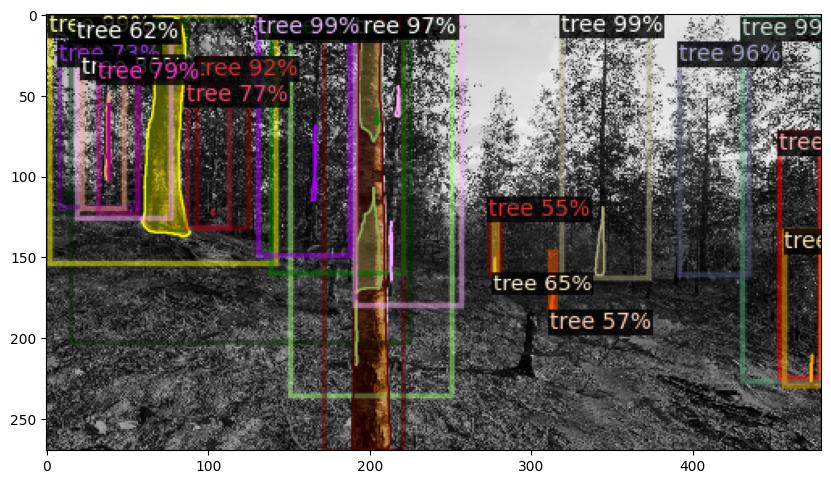

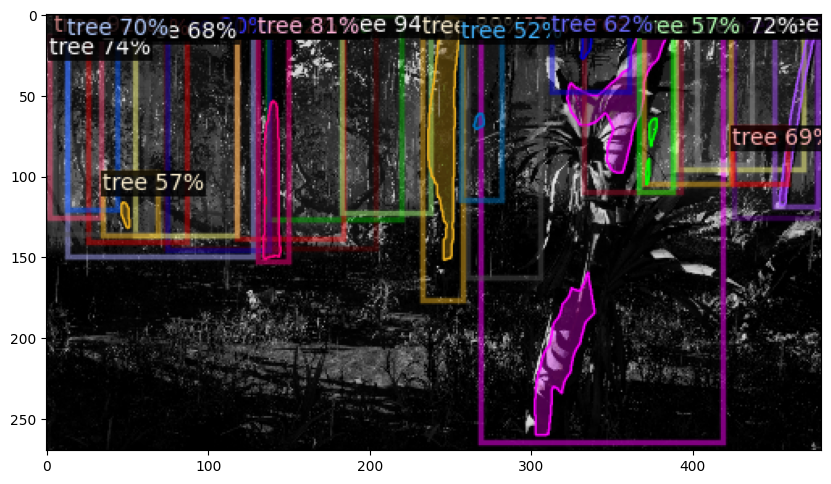

In [27]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(val_dataset_dicts, 2):    #select number of images for display
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=val_metadata,
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

##### Check average precision and recall

In [28]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("spread_valid", output_dir=cfg.OUTPUT_DIR)
val_loader = build_detection_test_loader(cfg, "spread_valid")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[01/15 19:35:24 d2.data.datasets.coco]: Loading /mnt/raid1/dataset/spread/spread-v2/valid.json takes 4.82 seconds.
[01/15 19:35:24 d2.data.datasets.coco]: Loaded 3042 images in COCO format from /mnt/raid1/dataset/spread/spread-v2/valid.json
[01/15 19:35:25 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|    tree    | 126271       |
|            |              |
[01/15 19:35:25 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[01/15 19:35:25 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[01/15 19:35:25 d2.data.common]: Serializing 3042 elements to byte tensors and concatenating them all ...
[01/15 19:35:54 d2.data.common]: Serialized dataset takes 242.05 MiB
[01/15 19:35:55 d2.evaluation.evaluator]: Start inference on 3042 batches
[01/15 19:3

[01/15 19:39:20 d2.evaluation.evaluator]: Total inference time: 0:03:16.560784 (0.064722 s / iter per device, on 1 devices)
[01/15 19:39:20 d2.evaluation.evaluator]: Total inference pure compute time: 0:02:46 (0.054728 s / iter per device, on 1 devices)
[01/15 19:39:20 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[01/15 19:39:20 d2.evaluation.coco_evaluation]: Saving results to /mnt/raid1/repos/maskdino/maskdino-output/mask_rcnn_R_101_DC5_3x/coco_instances_results.json
[01/15 19:39:21 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
[01/15 19:39:21 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[01/15 19:39:21 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.74 seconds.
[01/15 19:39:21 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[01/15 19:39:22 d2.evaluation.fast_eval_api]: COCOeval_opt.accumul

**Load a new image and segment it.**

In [29]:
os.makedirs('/tmp/trees', exist_ok=True)

In [30]:
!wget 'https://www.sciencefriday.com/wp-content/uploads/2021/12/Forest-trees.jpg' --output-document='/tmp/trees/Forest-trees.jpg'

--2025-01-15 19:39:34--  https://www.sciencefriday.com/wp-content/uploads/2021/12/Forest-trees.jpg
Resolving www.sciencefriday.com (www.sciencefriday.com)... 192.0.66.159, 2a04:fa87:fffd::c000:429f
Connecting to www.sciencefriday.com (www.sciencefriday.com)|192.0.66.159|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2359367 (2.2M) [image/jpeg]
Saving to: ‘/tmp/trees/Forest-trees.jpg’

/tmp/trees/Forest-t 100%[===================>]   2.25M  9.23MB/s    in 0.2s    

2025-01-15 19:39:35 (9.23 MB/s) - ‘/tmp/trees/Forest-trees.jpg’ saved [2359367/2359367]



In [31]:
def detectron2_predict(fn):
    new_im = cv2.imread(fn)
    outputs  = predictor(new_im)

    # We can use `Visualizer` to draw the predictions on the image.
    v = Visualizer(new_im[:, :, ::-1], metadata=train_metadata)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    cv2_imshow(out.get_image()[:, :, ::-1])

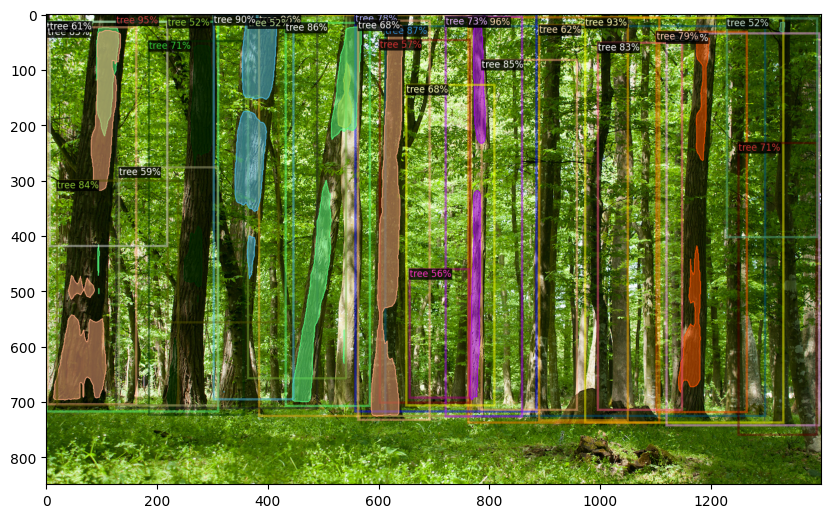

In [32]:
detectron2_predict(fn='/tmp/trees/Forest-trees.jpg')

--2025-01-15 19:39:38--  https://onetreeplanted.org/cdn/shop/files/black-forest-germany-1634665542362.jpg
Resolving onetreeplanted.org (onetreeplanted.org)... 23.227.38.32
Connecting to onetreeplanted.org (onetreeplanted.org)|23.227.38.32|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 668616 (653K) [image/jpeg]
Saving to: ‘/tmp/trees/black-forest-germany.jpg’

/tmp/trees/black-fo 100%[===================>] 652.95K  --.-KB/s    in 0.07s   

2025-01-15 19:39:38 (9.37 MB/s) - ‘/tmp/trees/black-forest-germany.jpg’ saved [668616/668616]



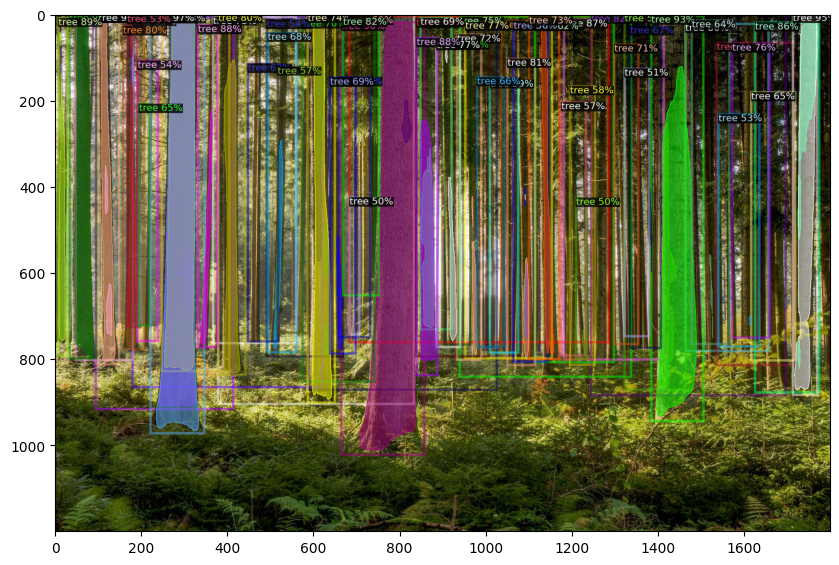

In [33]:
fn='/tmp/trees/black-forest-germany.jpg'
!wget 'https://onetreeplanted.org/cdn/shop/files/black-forest-germany-1634665542362.jpg' --output-document={fn}
detectron2_predict(fn=fn)

--2025-01-15 19:39:40--  https://onetreeplanted.org/cdn/shop/files/forest-in-the-rain-1634665541988.webp
Resolving onetreeplanted.org (onetreeplanted.org)... 23.227.38.32
Connecting to onetreeplanted.org (onetreeplanted.org)|23.227.38.32|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 519362 (507K) [image/jpeg]
Saving to: ‘/tmp/trees/forest-in-the-rain.webp’

/tmp/trees/forest-i 100%[===================>] 507.19K  --.-KB/s    in 0.08s   

2025-01-15 19:39:40 (6.44 MB/s) - ‘/tmp/trees/forest-in-the-rain.webp’ saved [519362/519362]



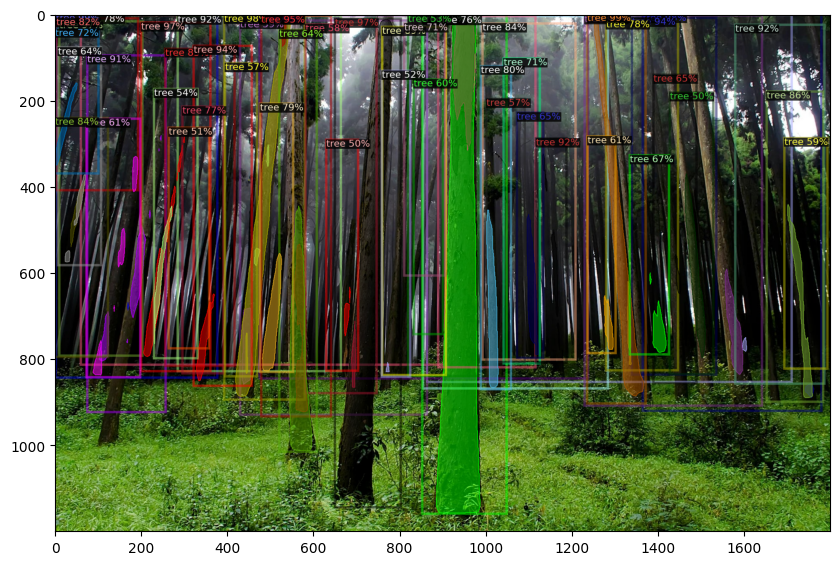

In [34]:
fn='/tmp/trees/forest-in-the-rain.webp'
!wget 'https://onetreeplanted.org/cdn/shop/files/forest-in-the-rain-1634665541988.webp' --output-document={fn}
detectron2_predict(fn=fn)

--2025-01-15 19:39:42--  https://www.nycgovparks.org/pagefiles/201/great-trees-banner__66fd87f0e849b.jpg
Resolving www.nycgovparks.org (www.nycgovparks.org)... 34.200.3.35, 98.85.75.120, 34.228.163.119
Connecting to www.nycgovparks.org (www.nycgovparks.org)|34.200.3.35|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2057733 (2.0M) [image/jpeg]
Saving to: ‘/tmp/trees/great-trees-in-nyc.jpg’

/tmp/trees/great-tr 100%[===================>]   1.96M  1.82MB/s    in 1.1s    

2025-01-15 19:39:43 (1.82 MB/s) - ‘/tmp/trees/great-trees-in-nyc.jpg’ saved [2057733/2057733]



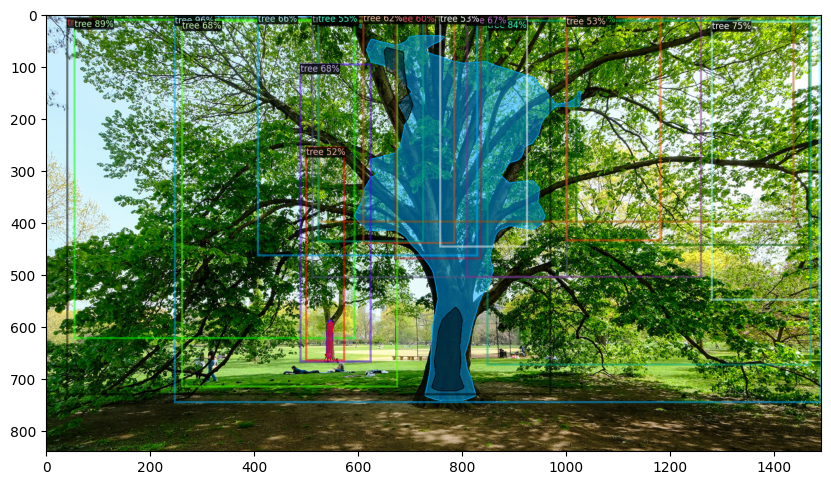

In [35]:
fn='/tmp/trees/great-trees-in-nyc.jpg'
!wget 'https://www.nycgovparks.org/pagefiles/201/great-trees-banner__66fd87f0e849b.jpg' --output-document={fn}
detectron2_predict(fn=fn)

--2025-01-15 19:39:44--  https://images.squarespace-cdn.com/content/v1/5cb3ca007a1fbd45aeff89ea/08d79b2d-21b5-41e9-9c52-1c14aaf2de34/nashville-tree-conservation-corps-how-trees-benefit-ecosystem-winter.jpg
Resolving images.squarespace-cdn.com (images.squarespace-cdn.com)... 151.101.64.238, 151.101.192.238, 151.101.128.238, ...
Connecting to images.squarespace-cdn.com (images.squarespace-cdn.com)|151.101.64.238|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 274501 (268K) [image/jpeg]
Saving to: ‘/tmp/trees/tree-in-winter.jpg’

/tmp/trees/tree-in- 100%[===================>] 268.07K  --.-KB/s    in 0.03s   

2025-01-15 19:39:44 (8.88 MB/s) - ‘/tmp/trees/tree-in-winter.jpg’ saved [274501/274501]



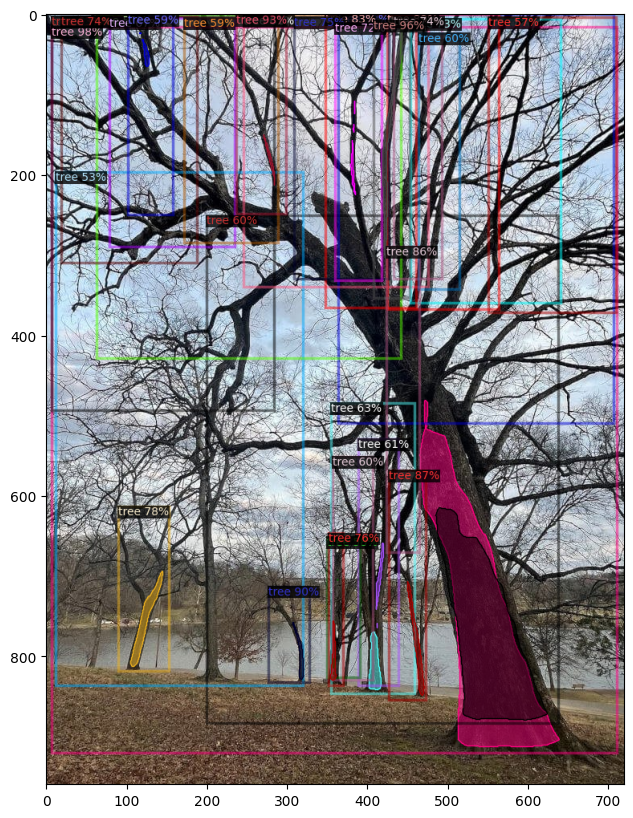

In [36]:
fn='/tmp/trees/tree-in-winter.jpg'
!wget 'https://images.squarespace-cdn.com/content/v1/5cb3ca007a1fbd45aeff89ea/08d79b2d-21b5-41e9-9c52-1c14aaf2de34/nashville-tree-conservation-corps-how-trees-benefit-ecosystem-winter.jpg' --output-document={fn}
detectron2_predict(fn=fn)

--2025-01-15 19:39:45--  https://www.arboroperations.com.au/wp-content/uploads/2021/08/american-elm.jpg
Resolving www.arboroperations.com.au (www.arboroperations.com.au)... 54.253.233.167
Connecting to www.arboroperations.com.au (www.arboroperations.com.au)|54.253.233.167|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1076645 (1.0M) [image/jpeg]
Saving to: ‘/tmp/trees/american-elm.jpg’

/tmp/trees/american 100%[===================>]   1.03M   503KB/s    in 2.1s    

2025-01-15 19:39:49 (503 KB/s) - ‘/tmp/trees/american-elm.jpg’ saved [1076645/1076645]



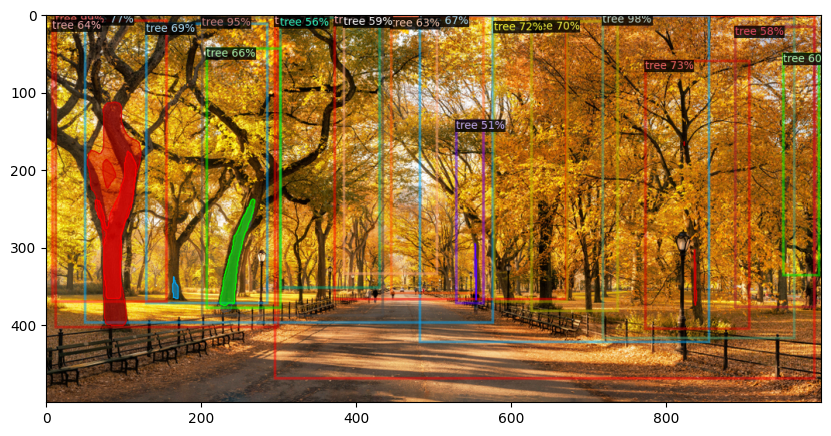

In [37]:
fn='/tmp/trees/american-elm.jpg'
!wget --user-agent='Mozilla 5.0' 'https://www.arboroperations.com.au/wp-content/uploads/2021/08/american-elm.jpg' --output-document={fn}
detectron2_predict(fn=fn)

--2025-01-15 19:39:50--  https://mothertreeproject.org/wp-content/uploads/2019/12/bill_web_still-image-test00086400_1-1.jpg
Resolving mothertreeproject.org (mothertreeproject.org)... 198.50.124.194
Connecting to mothertreeproject.org (mothertreeproject.org)|198.50.124.194|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 686185 (670K) [image/jpeg]
Saving to: ‘/tmp/trees/large-trees.jpg’

/tmp/trees/large-tr 100%[===================>] 670.10K   545KB/s    in 1.2s    

2025-01-15 19:39:52 (545 KB/s) - ‘/tmp/trees/large-trees.jpg’ saved [686185/686185]



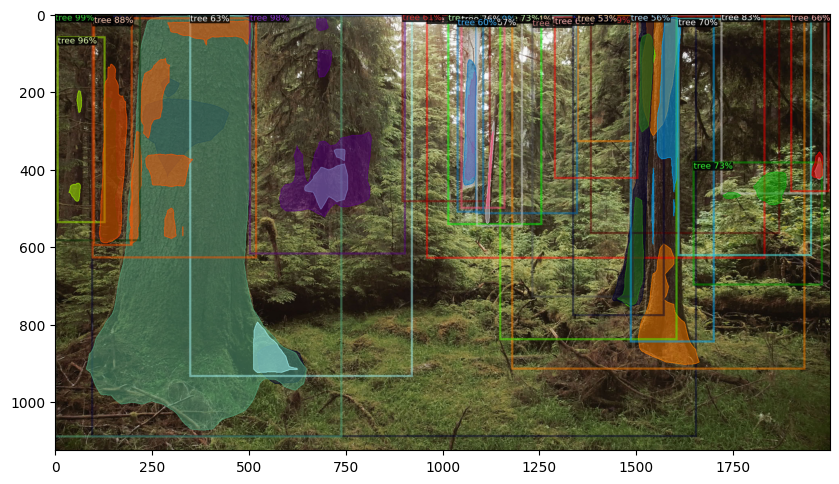

In [38]:
fn='/tmp/trees/large-trees.jpg'
!wget 'https://mothertreeproject.org/wp-content/uploads/2019/12/bill_web_still-image-test00086400_1-1.jpg' --output-document={fn}
detectron2_predict(fn=fn)

**Process multiple images in a directory and save the results in an output directory**

In [39]:
# Directory path to the input images folder
input_images_directory = "/tmp/trees"

# Output directory where the segmented images will be saved
output_directory = "/tmp/trees/results"  # Replace this with the path to your desired output directory
os.makedirs(output_directory, exist_ok=True)

# Loop over the images in the input folder
for image_filename in os.listdir(input_images_directory):
    image_path = os.path.join(input_images_directory, image_filename)
    if os.path.isdir(image_path):
        continue
    print(f'Reading image: {image_path}')
    new_im = cv2.imread(image_path)

    # Perform prediction on the new image
    outputs = predictor(new_im)  # Format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format

    # We can use `Visualizer` to draw the predictions on the image.
    v = Visualizer(new_im[:, :, ::-1], metadata=train_metadata)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    # Create the output filename with _result extension
    result_filename = os.path.splitext(image_filename)[0] + "_result.png"
    output_path = os.path.join(output_directory, result_filename)

    # Save the segmented image
    cv2.imwrite(output_path, out.get_image()[:, :, ::-1])

print("Segmentation of all images completed.")

Reading image: /tmp/trees/Forest-trees.jpg
Reading image: /tmp/trees/black-forest-germany.jpg
Reading image: /tmp/trees/forest-in-the-rain.webp
Reading image: /tmp/trees/great-trees-in-nyc.jpg
Reading image: /tmp/trees/tree-in-winter.jpg
Reading image: /tmp/trees/american-elm.jpg
Reading image: /tmp/trees/large-trees.jpg
Segmentation of all images completed.



**Segment images and save object level information into a csv file.**




In [40]:
import csv
from skimage.measure import regionprops, label


# Assuming you have already defined the 'predictor' object and loaded the model.
# Also, make sure 'metadata' is defined appropriately.

# Directory path to the input images folder
input_images_directory = "/tmp/trees"

# Output directory where the CSV file will be saved
output_directory = "/tmp/trees/results"
output_csv_path  = f"{output_directory}/output_objects.csv"  # Replace this with the path to your desired output CSV file

# Open the CSV file for writing
with open(output_csv_path, 'w', newline='') as csvfile:
    csvwriter = csv.writer(csvfile)

    # Write the header row in the CSV file
    csvwriter.writerow(["File Name", "Class Name", "Object Number", "Area", "Centroid", "BoundingBox"])  # Add more columns as needed for other properties

    # Loop over the images in the input folder
    for image_filename in os.listdir(input_images_directory):
        image_path = os.path.join(input_images_directory, image_filename)
        if os.path.isdir(image_path):
            continue
        print(f'Reading image: {image_path}')
        new_im = cv2.imread(image_path)

        # Perform prediction on the new image
        outputs = predictor(new_im)  # Format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format

        # Convert the predicted mask to a binary mask
        mask = outputs["instances"].pred_masks.to("cpu").numpy().astype(bool)

        # Get the predicted class labels
        class_labels = outputs["instances"].pred_classes.to("cpu").numpy()

        # Debugging: print class_labels and metadata.thing_classes
        #print("Class Labels:", class_labels)
        #print("Thing Classes:", train_metadata.thing_classes)

        # Use skimage.measure.regionprops to calculate object parameters
        labeled_mask = label(mask)
        props = regionprops(labeled_mask)

        # Write the object-level information to the CSV file
        for i, prop in enumerate(props):
            object_number = i + 1  # Object number starts from 1
            area = prop.area
            centroid = prop.centroid
            bounding_box = prop.bbox

            # Check if the corresponding class label exists
            if i < len(class_labels):
                class_label = class_labels[i]
                class_name = train_metadata.thing_classes[class_label]
            else:
                # If class label is not available (should not happen), use 'Unknown' as class name
                class_name = 'Unknown'

            # Write the object-level information to the CSV file
            csvwriter.writerow([image_filename, class_name, object_number, area, centroid, bounding_box])  # Add more columns as needed for other properties

print("Object-level information saved to CSV file.")

Reading image: /tmp/trees/Forest-trees.jpg
Reading image: /tmp/trees/black-forest-germany.jpg
Reading image: /tmp/trees/forest-in-the-rain.webp
Reading image: /tmp/trees/great-trees-in-nyc.jpg
Reading image: /tmp/trees/tree-in-winter.jpg
Reading image: /tmp/trees/american-elm.jpg
Reading image: /tmp/trees/large-trees.jpg
Object-level information saved to CSV file.


**Generate plots to understand the objects**

/tmp/ipykernel_2128571/3638285612.py:23: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x="Class Name", y="Object Number", data=avg_objects_per_class, ci=None, order=class_names)


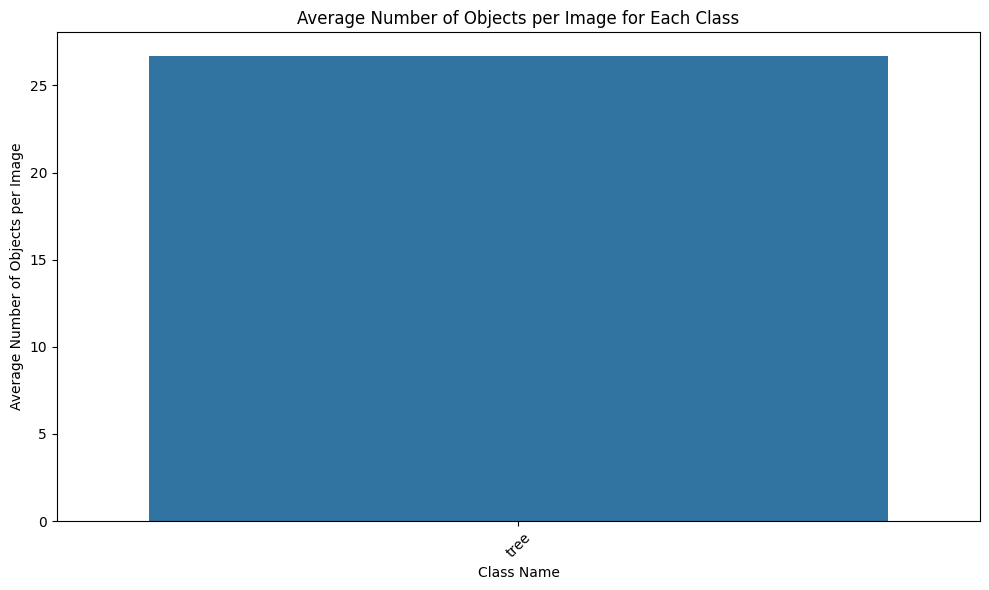

/tmp/ipykernel_2128571/3638285612.py:37: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x="Class Name", y="Area", data=avg_area_per_class, ci=None, order=class_names)


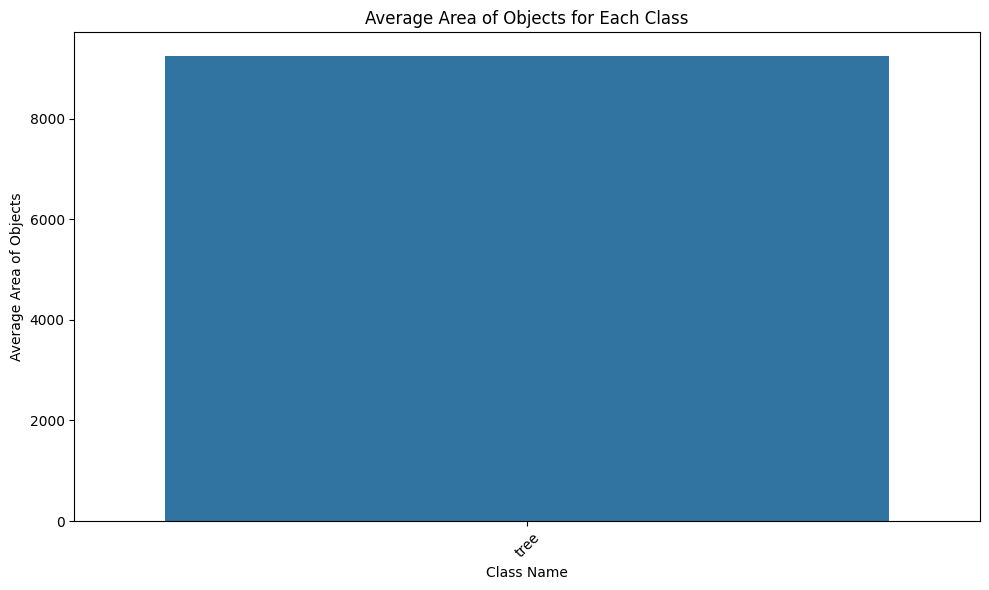

In [41]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Output directory where the CSV file will be saved
output_directory = "/tmp/trees/results"
csv_file_path    = f"{output_directory}/output_objects.csv"  # Replace this with the path to your desired output CSV file

# Load the CSV file into a pandas DataFrame
df = pd.read_csv(csv_file_path)

# Get class names from train_metadata.thing_classes
class_names = train_metadata.thing_classes

# Group the data by both "File Name" and "Class Name" and calculate the average number of objects per image for each class
# first group the data by both "File Name" and "Class Name" and count the number of objects within each group.
#Then, group the data by "Class Name" only and calculate the mean of the counts, which gives us the average number of objects per image for each class.
avg_objects_per_class = df.groupby(["File Name", "Class Name"])["Object Number"].count().reset_index()
avg_objects_per_class = avg_objects_per_class.groupby("Class Name")["Object Number"].mean().reset_index()

# Plot: Average number of objects per image for each class
plt.figure(figsize=(10, 6))
sns.barplot(x="Class Name", y="Object Number", data=avg_objects_per_class, ci=None, order=class_names)
plt.xticks(rotation=45)
plt.xlabel("Class Name")
plt.ylabel("Average Number of Objects per Image")
plt.title("Average Number of Objects per Image for Each Class")
plt.tight_layout()
plt.show()


# Group the data by class and calculate the average area of objects for each class
avg_area_per_class = df.groupby("Class Name")["Area"].mean().reset_index()

# Plot: Average area of objects for each class
plt.figure(figsize=(10, 6))
sns.barplot(x="Class Name", y="Area", data=avg_area_per_class, ci=None, order=class_names)
plt.xticks(rotation=45)
plt.xlabel("Class Name")
plt.ylabel("Average Area of Objects")
plt.title("Average Area of Objects for Each Class")
plt.tight_layout()
plt.show()

**Saving binary (actually multinary) images for each class for further processing.** Here, for each input image we will save n images corresponding to the number of classes. In our example, we will save 4 images for each image corresponding to the 4 classes. Each of these images will contain objects numbered 1, 2, 3, etc. - basically instance segmentation like images. These images can be used for further downstream processing.

In [42]:
import os
import cv2
import numpy as np
import torch
from detectron2.utils.visualizer import Visualizer

# Directory path to the input images folder
input_images_directory = "/tmp/trees"

# Output directory where the segmented images will be saved
output_directory = "/tmp/trees/results/instances"
os.makedirs(output_directory, exist_ok=True)

# Loop over the images in the input folder
for image_filename in os.listdir(input_images_directory):
    image_path = os.path.join(input_images_directory, image_filename)
    if os.path.isdir(image_path):
        continue
    print(f'Reading image: {image_path}')
    new_im = cv2.imread(image_path)

    # Perform prediction on the new image
    outputs = predictor(new_im)  # Format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format

    # Create a dictionary to store the mask for each class with unique integer labels
    class_masks = {class_name: torch.zeros_like(outputs["instances"].pred_masks[0], dtype=torch.uint8, device=torch.device("cuda:0"))
                   for class_name in train_metadata.thing_classes}

    # Assign a unique integer label to each object in the mask
    for i, pred_class in enumerate(outputs["instances"].pred_classes):
        class_name = train_metadata.thing_classes[pred_class]
        class_masks[class_name] = torch.where(outputs["instances"].pred_masks[i].to(device=torch.device("cuda:0")),
                                              i + 1,
                                              class_masks[class_name])

    # Save the masks for each class with unique integer labels
    for class_name, class_mask in class_masks.items():
        # Convert the tensor to a NumPy array and then to a regular (CPU) array
        class_mask_np = class_mask.cpu().numpy()

        # Create the output filename with _class_name_result.png extension
        class_filename = os.path.splitext(image_filename)[0] + f"_{class_name}_result.png"
        class_output_path = os.path.join(output_directory, class_filename)

        # Save the image with unique integer labels
        cv2.imwrite(class_output_path, class_mask_np.astype(np.uint8))

print("Segmentation of all images completed.")

Reading image: /tmp/trees/Forest-trees.jpg
Reading image: /tmp/trees/black-forest-germany.jpg
Reading image: /tmp/trees/forest-in-the-rain.webp
Reading image: /tmp/trees/great-trees-in-nyc.jpg
Reading image: /tmp/trees/tree-in-winter.jpg
Reading image: /tmp/trees/american-elm.jpg
Reading image: /tmp/trees/large-trees.jpg
Segmentation of all images completed.
